In [1]:
import logging
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pyobsbox import Checker

In [3]:
logging.getLogger("pyobsbox").setLevel(logging.WARNING)
logging.getLogger("pyobsbox.plotter").setLevel(logging.DEBUG)

# List models

In [4]:
models_folder = Path("../../models")

In [5]:
[model.name for model in list(models_folder.glob('model_*'))]

['model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42',
 'model_dense_512_128_32_8_B1H_Inst_center_scale_100_seed_42',
 'model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_seed_42',
 'model_time_dist_32_16_B1H_Inst_500',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_stride_4_B1H_Inst',
 'model_conv_32_16_stride_4_B1H_Inst_jorg',
 'model_conv_max_pool_64_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_2049_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_znorm_seed_42',
 'model_conv_32

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_4_stride_4_2_noDO_decode_B1H_Inst_min_max_rolling_avg_window_65_seed_42_epochs_100"

In [7]:
checker = Checker(model_path)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           384       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           10272     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            2576      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              6

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

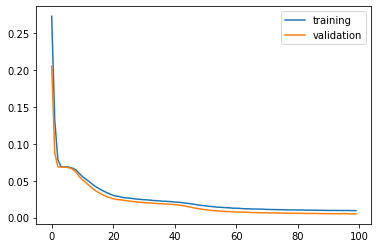

In [8]:
checker.plot_loss()

In [9]:
train_data, train_meta = checker.load_train_dataset()
train_prediction = checker.predict(train_data)

bunch_sorted_index: [2 0 1]
group_bunches: [2375. 3429.  811.]
group_bunches sorted: [ 811. 2375. 3429.]
restore_index: [1 2 0]
group_bunches restored: [2375. 3429.  811.]

50/50 [==============================] - 56s 1s/step


In [10]:
train_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
1160,Inst,7157,1,h,7,2018-09-13 01:43:10,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7157/...,588,508.0,362.0,65536,4
2975,Inst,7427,1,h,7,2018-11-09 03:42:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7427/...,64,952.0,23.0,65536,11
5257,Inst,7299,1,h,7,2018-10-14 04:30:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7299/...,152,209.0,9.0,65536,20
450,Inst,6587,1,h,7,2018-04-21 15:05:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6587/...,1116,1171.0,496.0,65536,1
7724,Inst,6603,1,h,7,2018-04-23 19:50:13,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6603/...,1380,1106.0,885.0,65536,30


In [11]:
train_meta.shape

(396800, 12)

In [12]:
train_data.shape

(396800, 2048, 1)

In [13]:
train_prediction.shape

(396800, 2048, 1)

In [14]:
validation_data, validation_meta = checker.load_validation_dataset()
validation_prediction = checker.predict(validation_data)


5/5 [==============================] - 4s 894ms/step


In [15]:
validation_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4808,Inst,6279,1,h,7,2017-10-07 11:24:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6279/...,1868,1589.0,865.0,65536,18
1244,Inst,6612,1,h,7,2018-04-25 13:59:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6612/...,603,337.0,74.0,65536,4
5767,Inst,7433,1,h,7,2018-11-10 00:49:15,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7433/...,260,2821.0,210.0,65536,22
7206,Inst,6343,1,h,7,2017-10-28 06:50:00,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6343/...,780,139.0,59.0,65536,28
7624,Inst,6279,1,h,7,2017-10-07 11:24:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6279/...,1868,1589.0,865.0,65536,29


In [16]:
validation_meta.shape

(39680, 12)

In [17]:
validation_data.shape

(39680, 2048, 1)

In [18]:
validation_prediction.shape

(39680, 2048, 1)

In [19]:
def plot_train_index(index: int):
    """Helper function to plot a sample from the train dataset.
    """
    true_signal = train_data[index]
    predicted_signal = train_prediction[index]
    metadata_row = train_meta.iloc[index]
    print(f"index: {index}")
    print(f"Error: {train_error[index]}")
    print(metadata_row)
    checker.plot_sample(metadata_row, true_signal, predicted_signal)
    plt.show()
    encoded = checker.encode(true_signal)
    plt.imshow(encoded)
    plt.show()

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

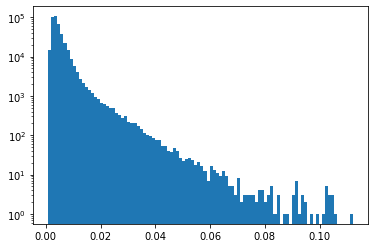

In [20]:
train_error = checker.MSE(train_data, train_prediction)
checker.plot_error(train_error, bins=100)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

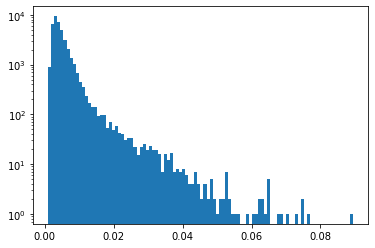

In [21]:
validation_error = checker.MSE(validation_data, validation_prediction)
checker.plot_error(validation_error, bins=100)

In [22]:
# Histogram peak
hist, bins = np.histogram(train_error, bins=100)
hist_peak = bins[np.argmax(hist)]

index: 0
Error: 0.0033672211113642365
type                                                         Inst
fill                                                         7157
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-13 01:43:10
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7157/...
n_bunches                                                     588
bunch_index                                                   508
bunch_number                                                  362
ts_length                                                   65536
chunk                                                           4
Name: 1160, dtype: object


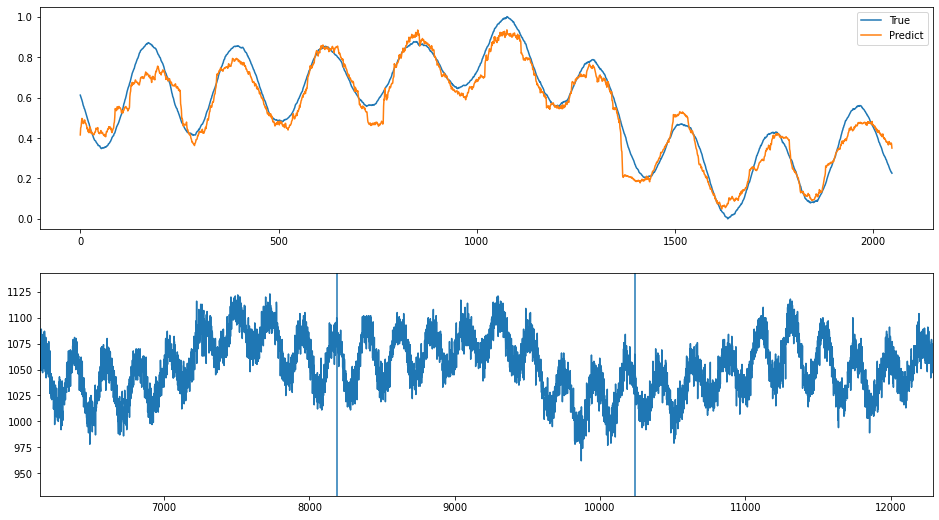

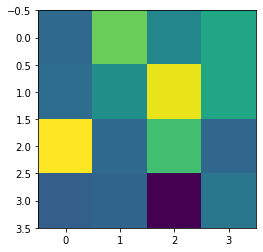

In [23]:
# plotting a random sample
plot_train_index(0)

In [24]:
sorted_error_indices = np.argsort(train_error)

# From left to right

index: 363261
Error: 0.000914066254466216
type                                                         Inst
fill                                                         7120
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-03 03:55:17
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7120/...
n_bunches                                                    2556
bunch_index                                                  2789
bunch_number                                                 2074
ts_length                                                   65536
chunk                                                          12
Name: 3315, dtype: object


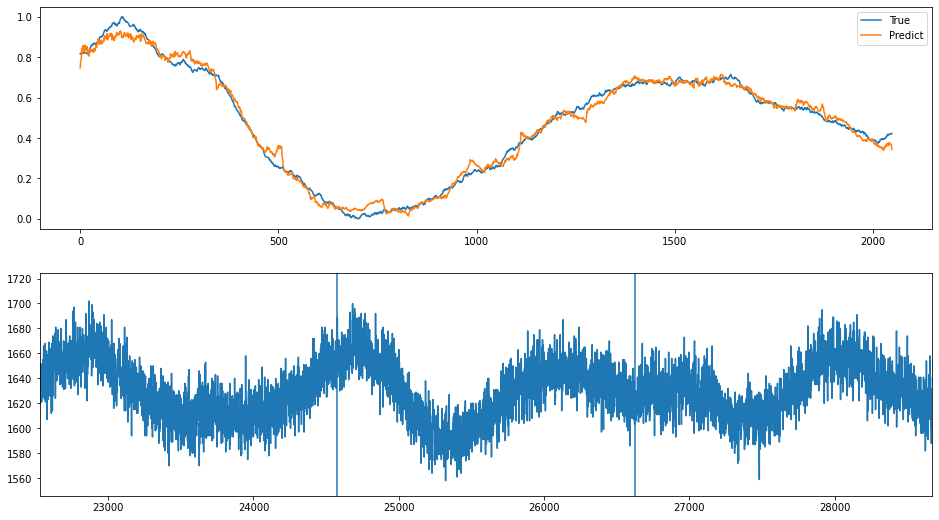

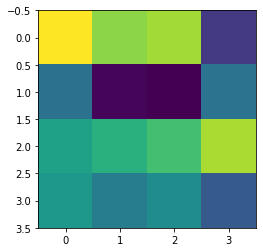

index: 37308
Error: 0.0009296008179055505
type                                                         Inst
fill                                                         7356
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-25 23:03:58
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7356/...
n_bunches                                                     156
bunch_index                                                   302
bunch_number                                                  128
ts_length                                                   65536
chunk                                                          11
Name: 2823, dtype: object


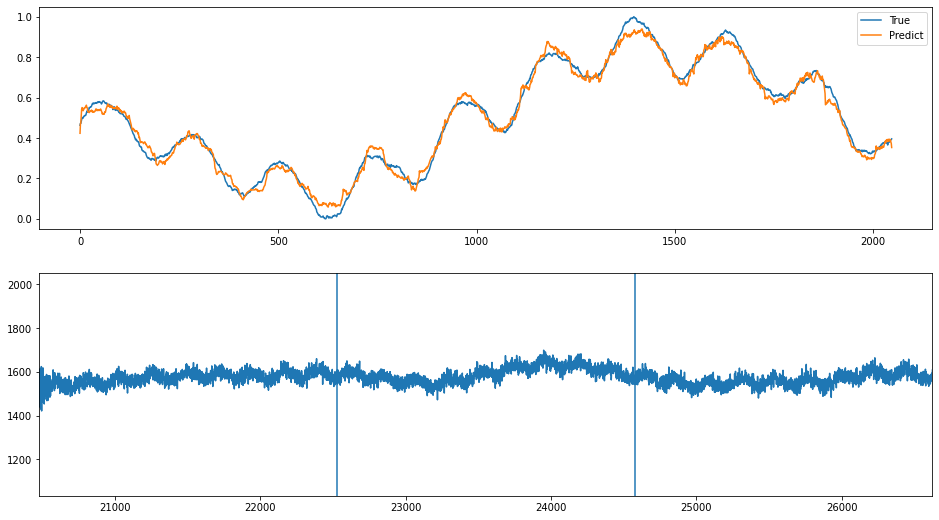

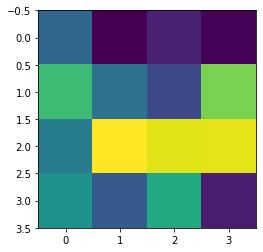

index: 89064
Error: 0.0009703405789934691
type                                                         Inst
fill                                                         7137
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-08 05:01:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7137/...
n_bunches                                                    2556
bunch_index                                                   293
bunch_number                                                  199
ts_length                                                   65536
chunk                                                           3
Name: 827, dtype: object


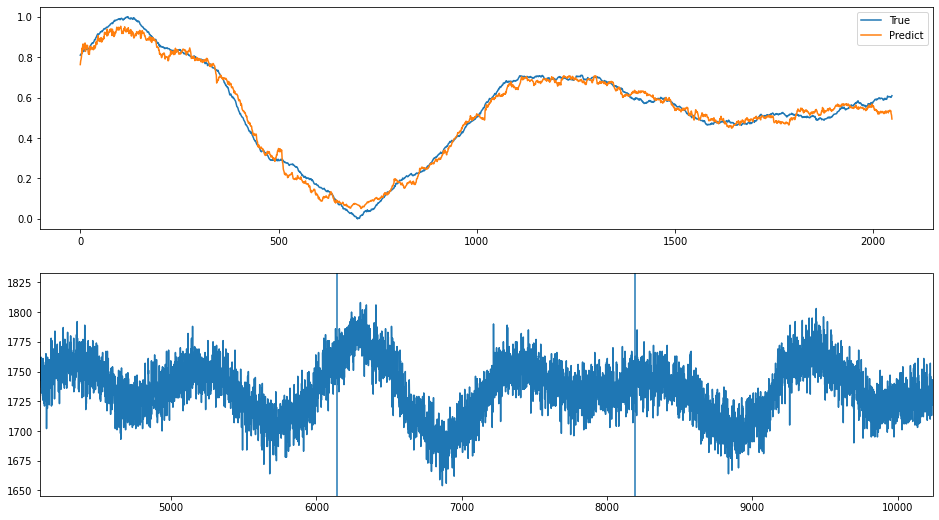

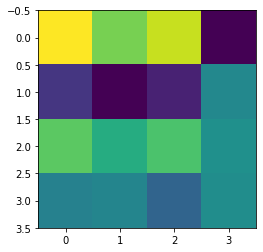

index: 23365
Error: 0.0009751324213005257
type                                                         Inst
fill                                                         6271
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-04 11:54:55
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6271/...
n_bunches                                                    1836
bunch_index                                                  1200
bunch_number                                                  632
ts_length                                                   65536
chunk                                                          11
Name: 2875, dtype: object


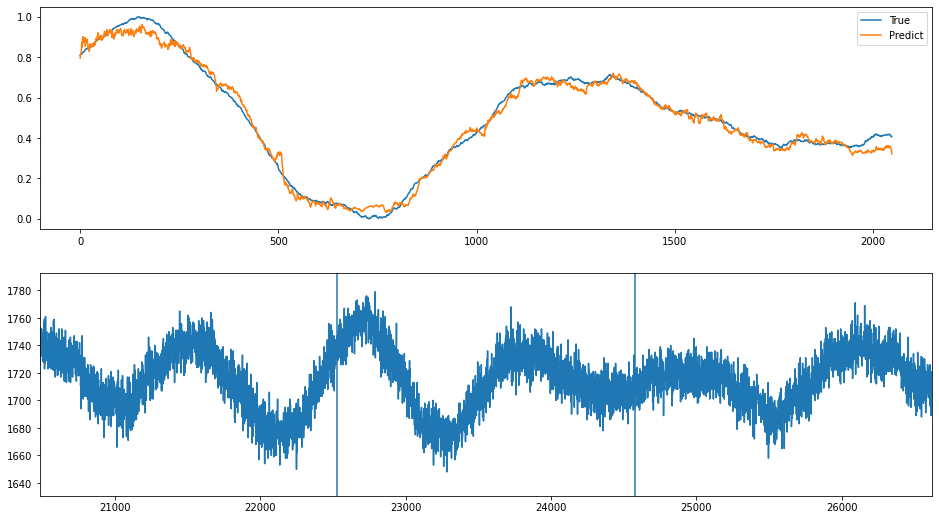

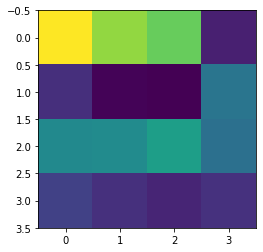

index: 245337
Error: 0.000979618308955473
type                                                         Inst
fill                                                         7137
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-08 05:01:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7137/...
n_bunches                                                    2556
bunch_index                                                   847
bunch_number                                                  614
ts_length                                                   65536
chunk                                                           3
Name: 1010, dtype: object


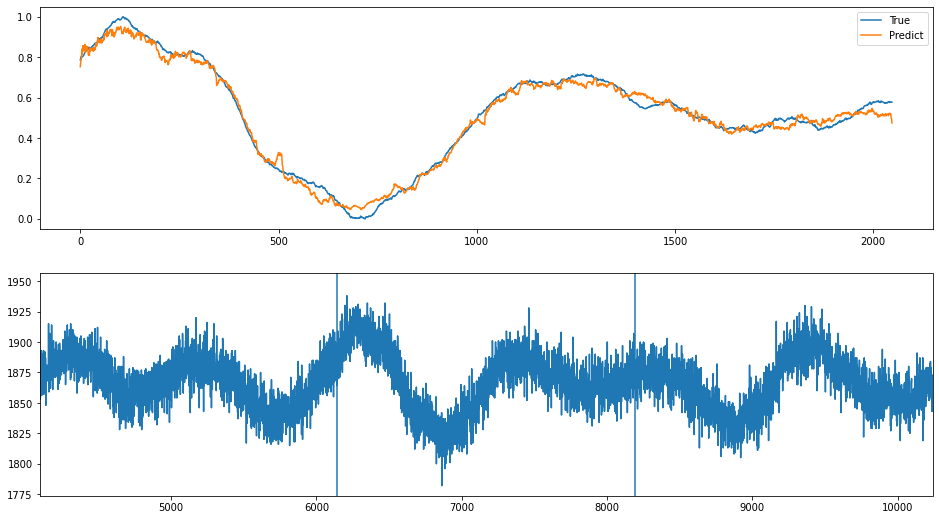

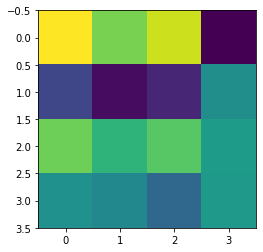

index: 212985
Error: 0.0009983350606227615
type                                                         Inst
fill                                                         6271
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-04 11:54:55
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6271/...
n_bunches                                                    1836
bunch_index                                                  2511
bunch_number                                                 1344
ts_length                                                   65536
chunk                                                          11
Name: 2842, dtype: object


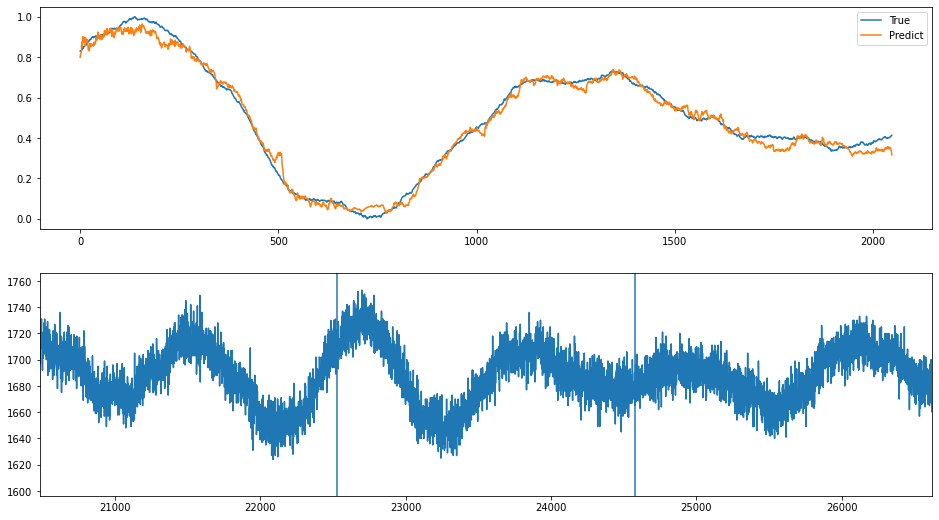

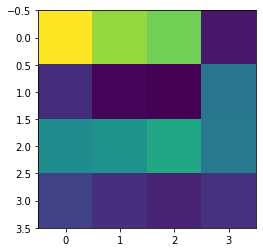

index: 167515
Error: 0.0010082085594725098
type                                                         Inst
fill                                                         7120
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-03 03:55:17
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7120/...
n_bunches                                                    2556
bunch_index                                                  2761
bunch_number                                                 2046
ts_length                                                   65536
chunk                                                          12
Name: 3300, dtype: object


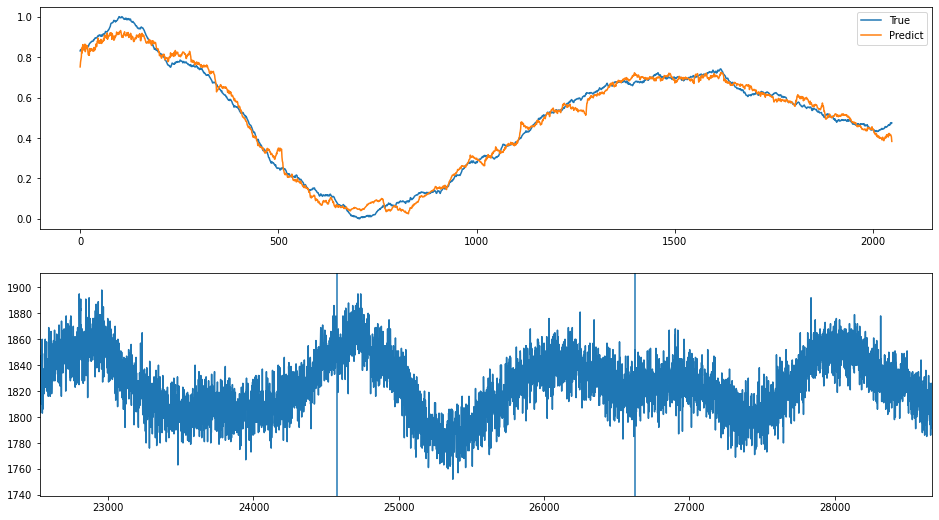

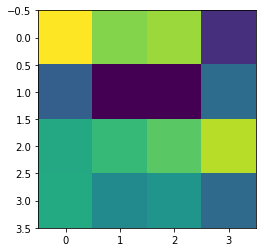

index: 188857
Error: 0.0010374550032898407
type                                                         Inst
fill                                                         7256
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-04 02:45:39
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7256/...
n_bunches                                                     924
bunch_index                                                    99
bunch_number                                                   50
ts_length                                                   65536
chunk                                                          29
Name: 7503, dtype: object


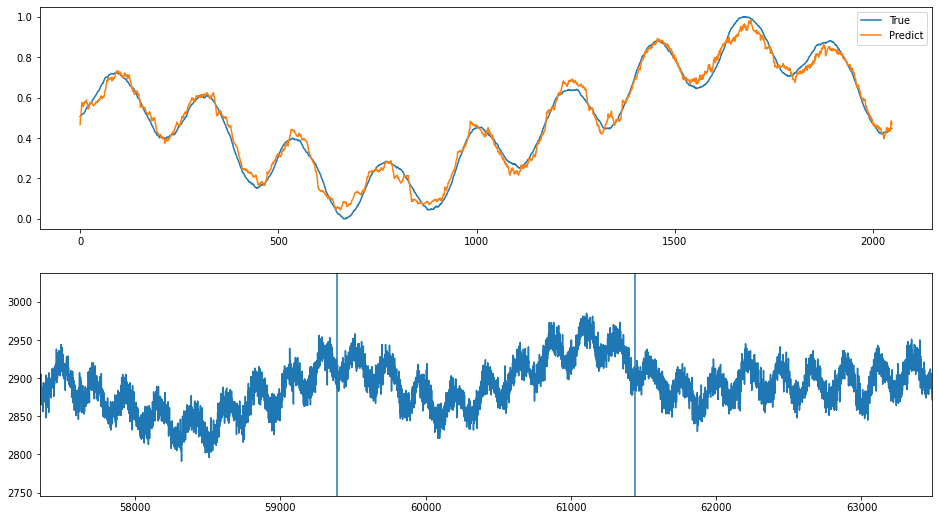

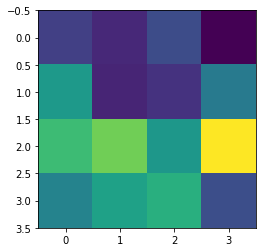

index: 73713
Error: 0.001052999165288846
type                                                         Inst
fill                                                         6364
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-06 07:02:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/...
n_bunches                                                    1868
bunch_index                                                  2381
bunch_number                                                 1281
ts_length                                                   65536
chunk                                                          13
Name: 3342, dtype: object


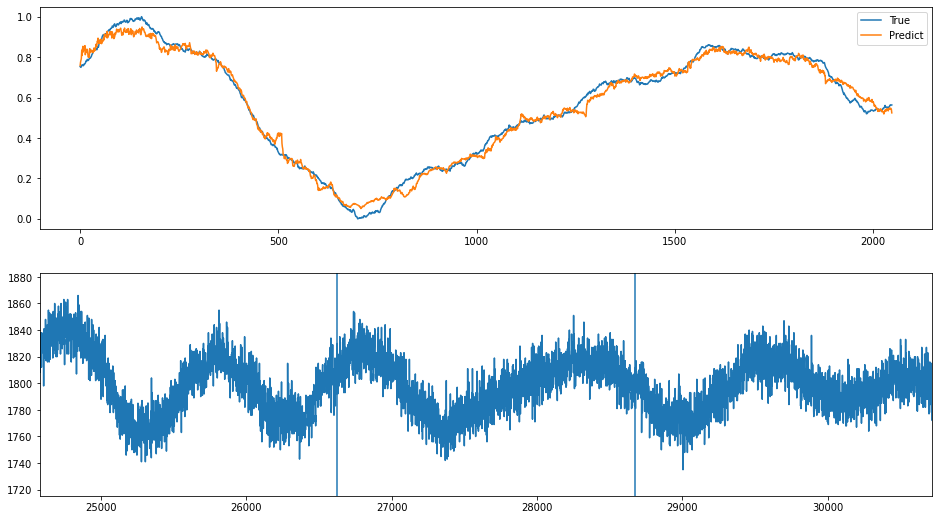

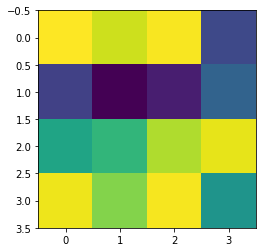

index: 122727
Error: 0.001053988299038256
type                                                         Inst
fill                                                         6239
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-24 05:32:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6239/...
n_bunches                                                    1358
bunch_index                                                  2078
bunch_number                                                  774
ts_length                                                   65536
chunk                                                          15
Name: 3894, dtype: object


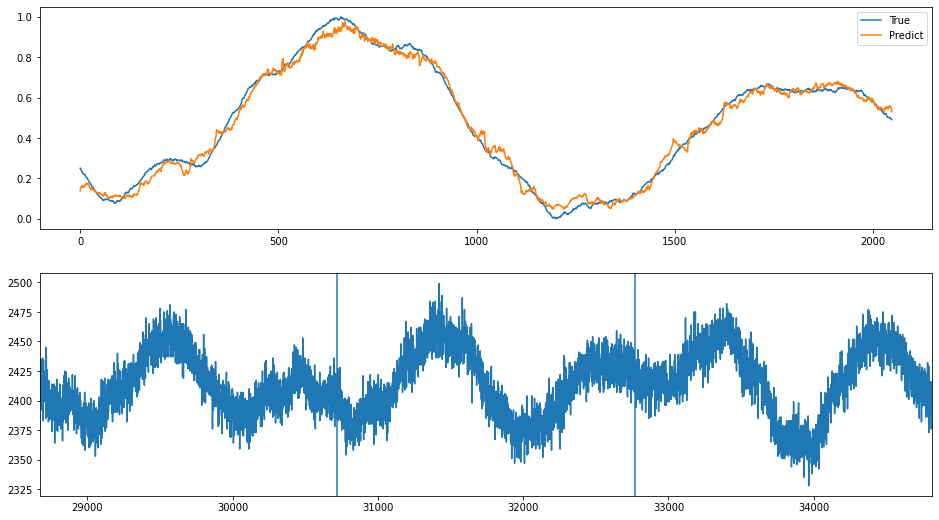

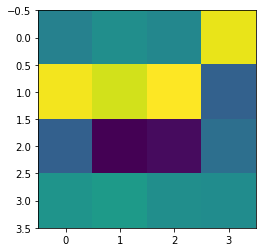

In [25]:
for i in range(10):
    index = sorted_error_indices[i]
    plot_train_index(index)

# From right to left

index: 22794
Error: 0.11208744347661184
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          23
Name: 6022, dtype: object


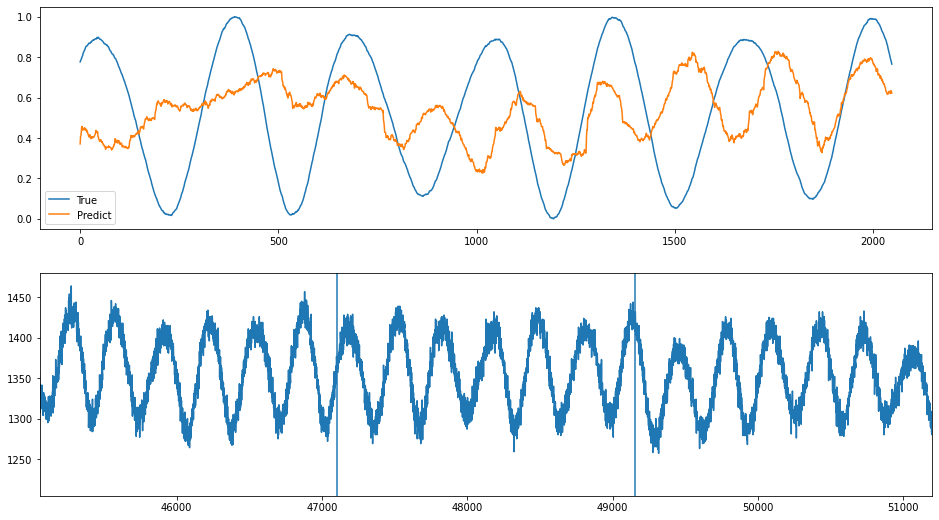

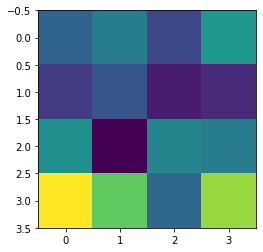

index: 88818
Error: 0.10620573967371011
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          25
Name: 6549, dtype: object


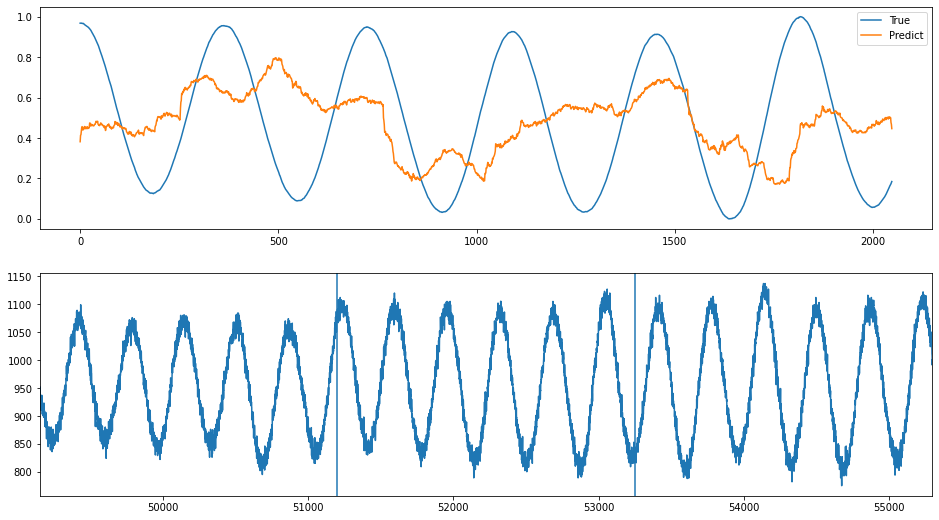

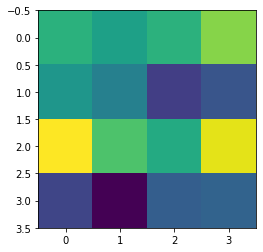

index: 95006
Error: 0.10454031703377664
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           1
Name: 405, dtype: object


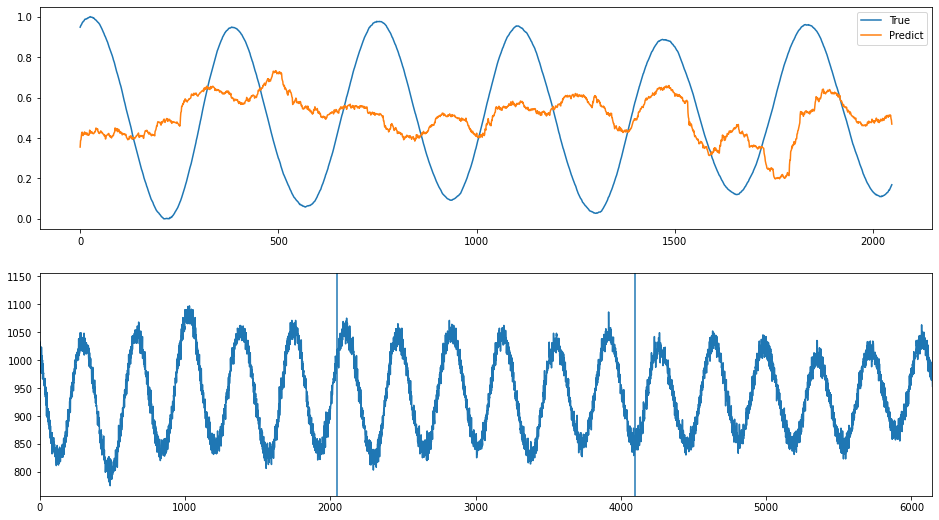

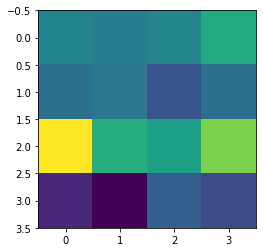

index: 19863
Error: 0.10448529444820565
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                           9
Name: 2438, dtype: object


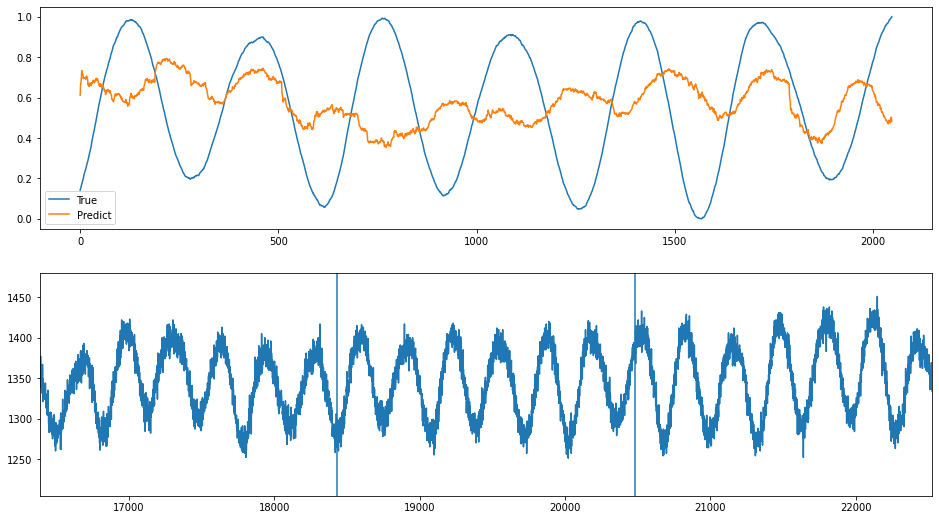

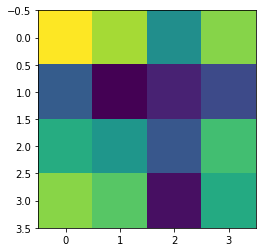

index: 91434
Error: 0.1043878654515635
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          11
Name: 2965, dtype: object


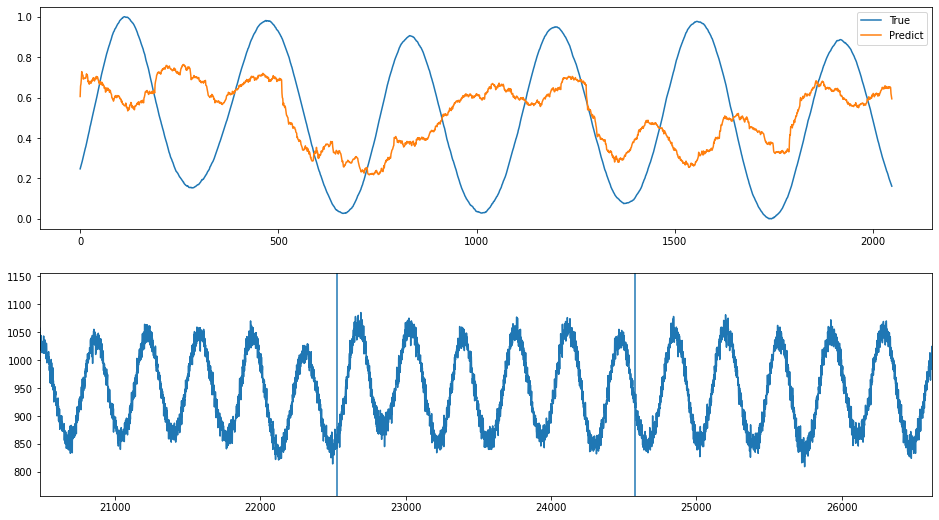

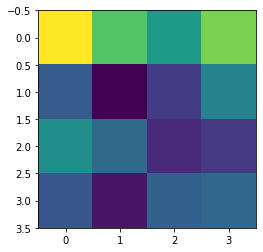

index: 88632
Error: 0.10394203493564179
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          26
Name: 6805, dtype: object


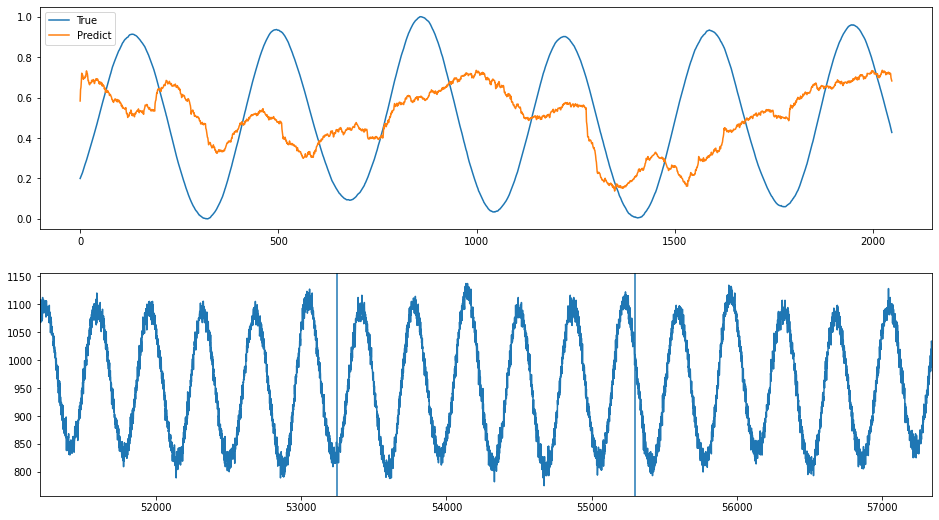

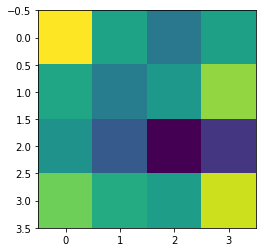

index: 94551
Error: 0.10356126891389486
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           9
Name: 2453, dtype: object


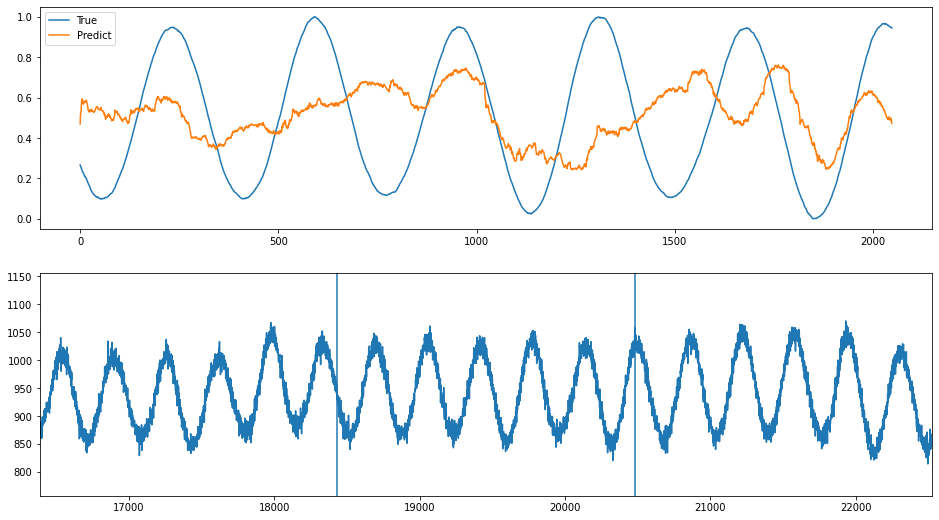

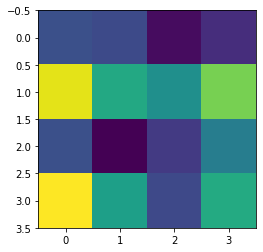

index: 88732
Error: 0.10352047848146717
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           2
Name: 661, dtype: object


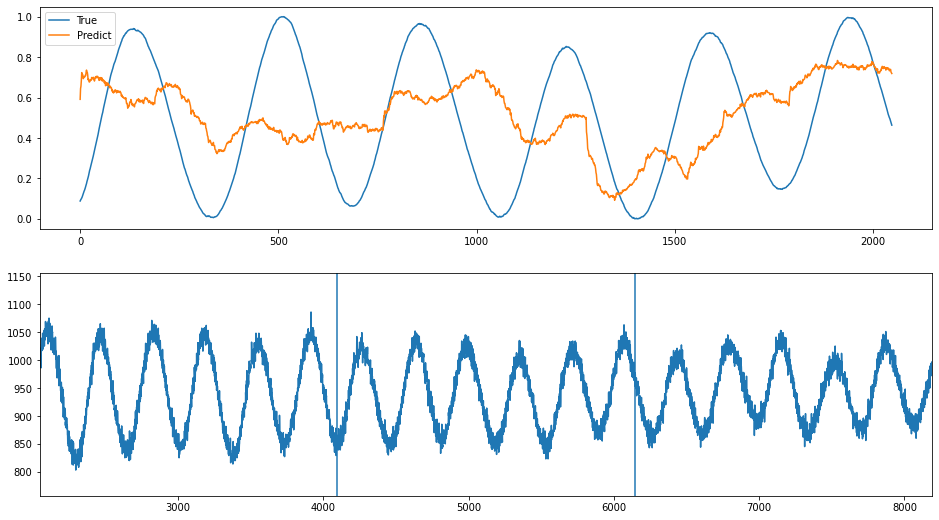

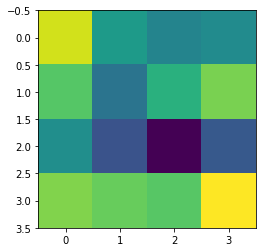

index: 91781
Error: 0.10292622447004
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          19
Name: 5013, dtype: object


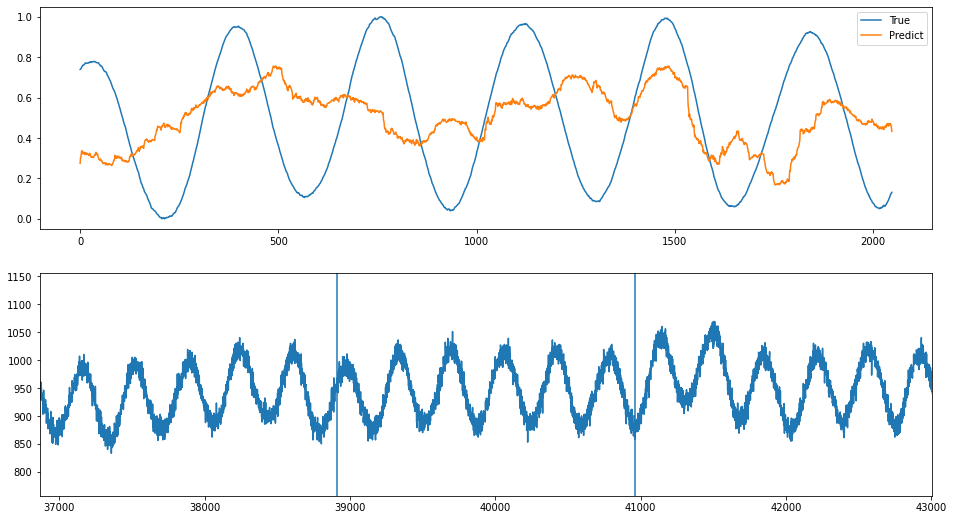

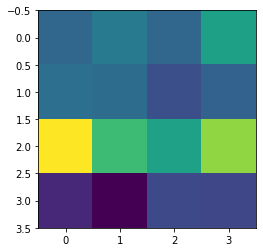

index: 20207
Error: 0.10283898462527014
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                           5
Name: 1414, dtype: object


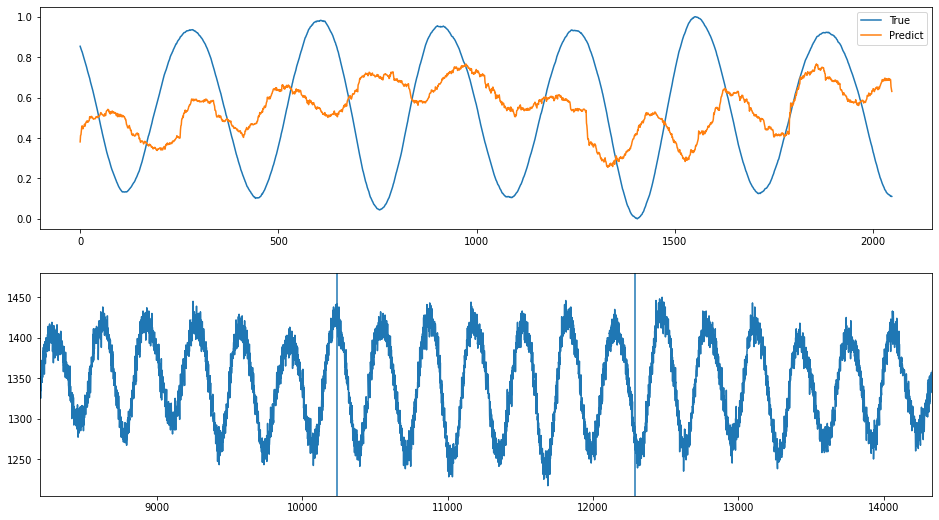

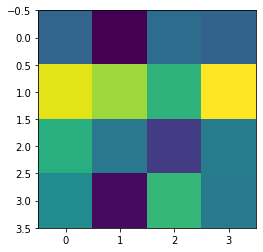

index: 90367
Error: 0.10275210520401148
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          12
Name: 3221, dtype: object


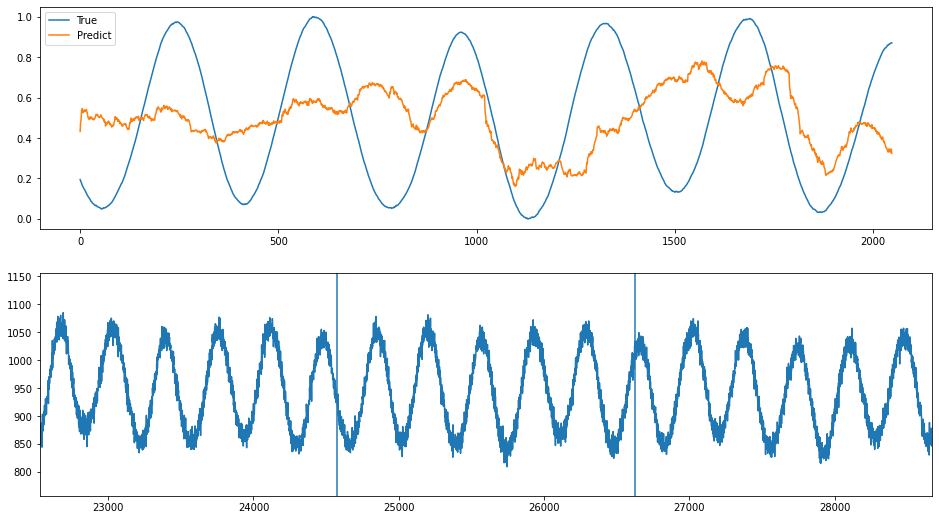

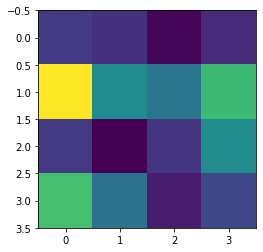

index: 89232
Error: 0.10238299091485117
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          14
Name: 3733, dtype: object


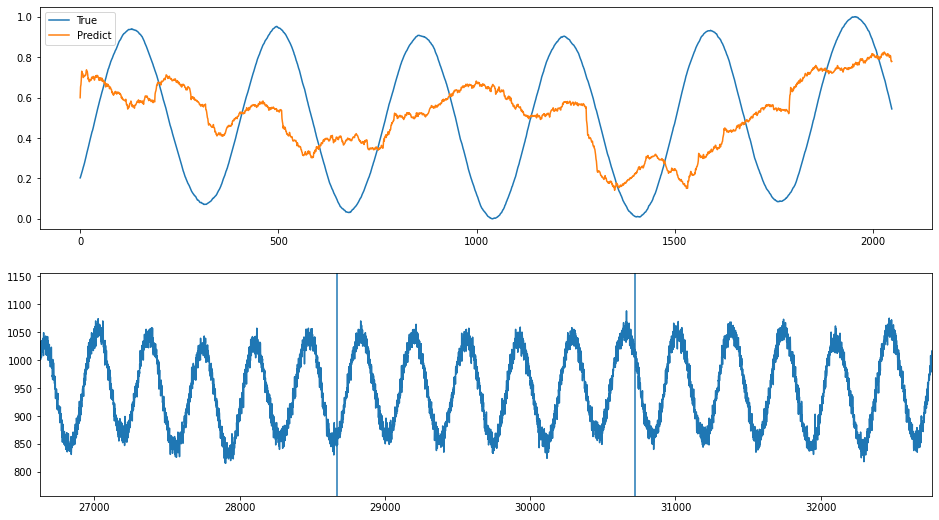

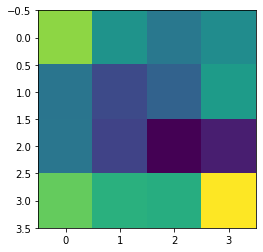

index: 94915
Error: 0.10217851146763621
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          15
Name: 3989, dtype: object


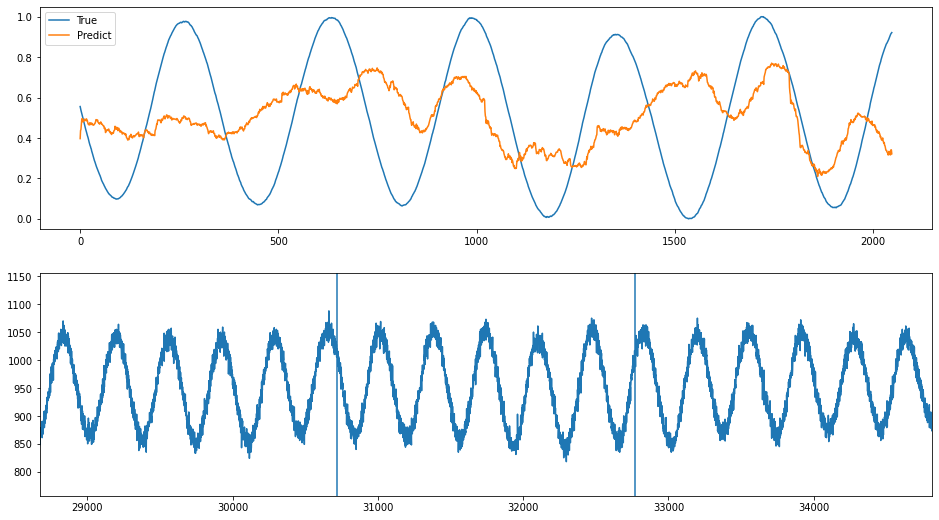

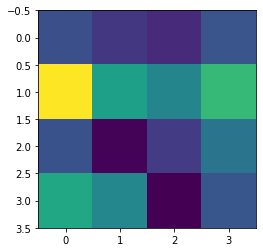

index: 91941
Error: 0.10115187087782798
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          28
Name: 7317, dtype: object


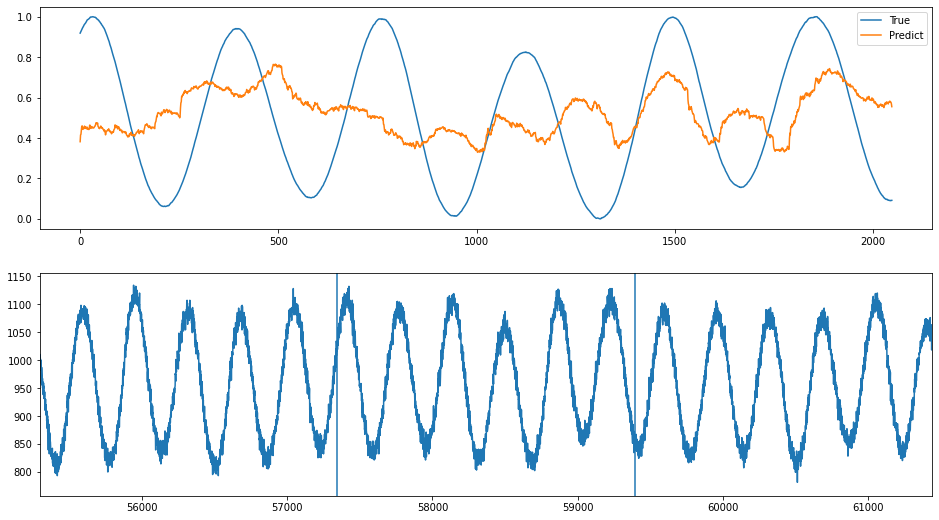

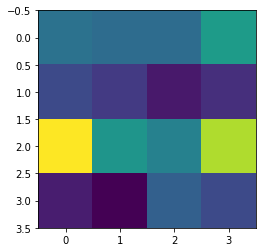

index: 93821
Error: 0.09968587103796675
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          16
Name: 4245, dtype: object


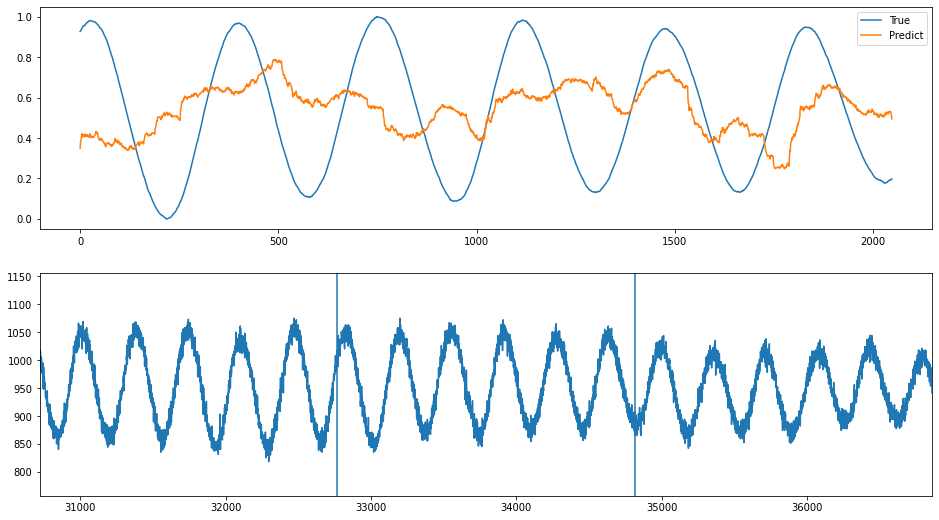

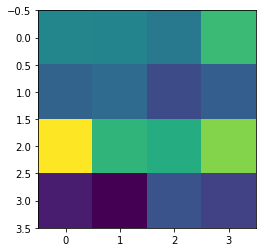

index: 90458
Error: 0.09689818650955438
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          17
Name: 4501, dtype: object


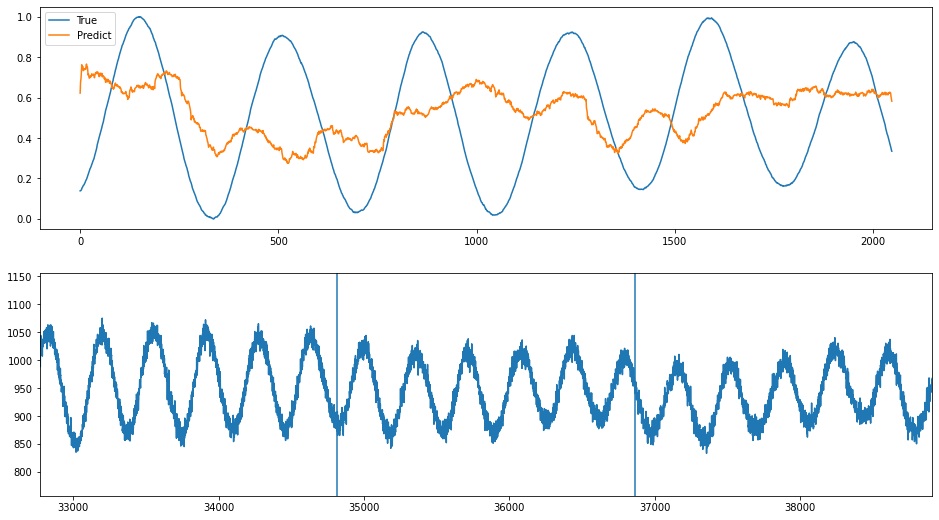

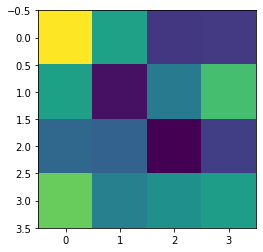

index: 19034
Error: 0.09525264470066222
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                           4
Name: 1158, dtype: object


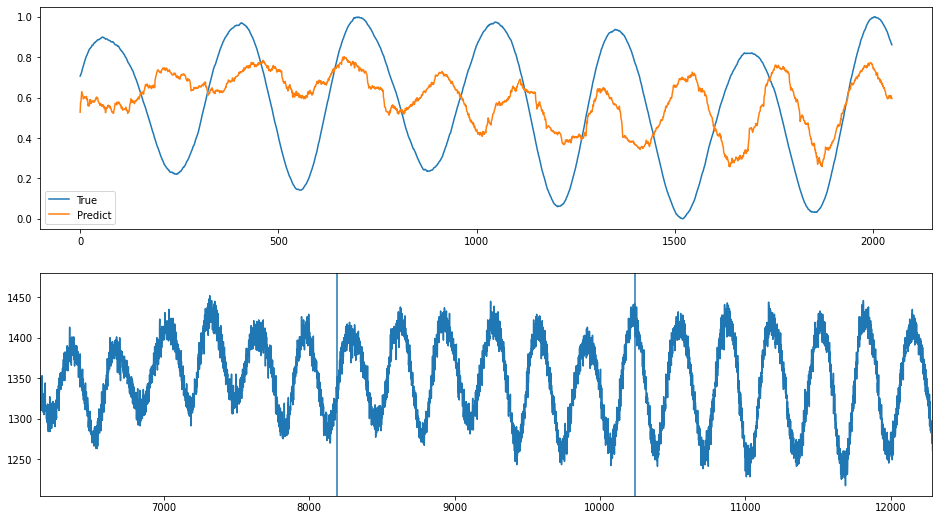

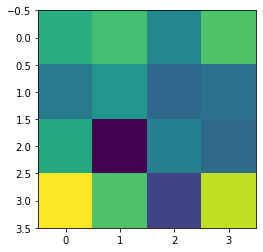

index: 89569
Error: 0.09467967582107818
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          29
Name: 7573, dtype: object


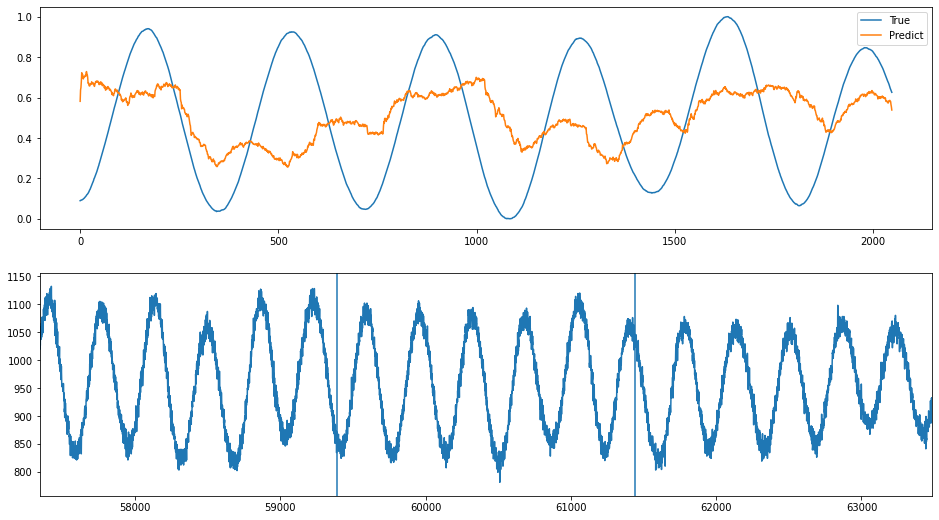

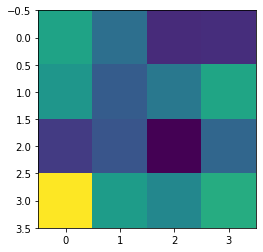

index: 92372
Error: 0.09400173648123993
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          10
Name: 2709, dtype: object


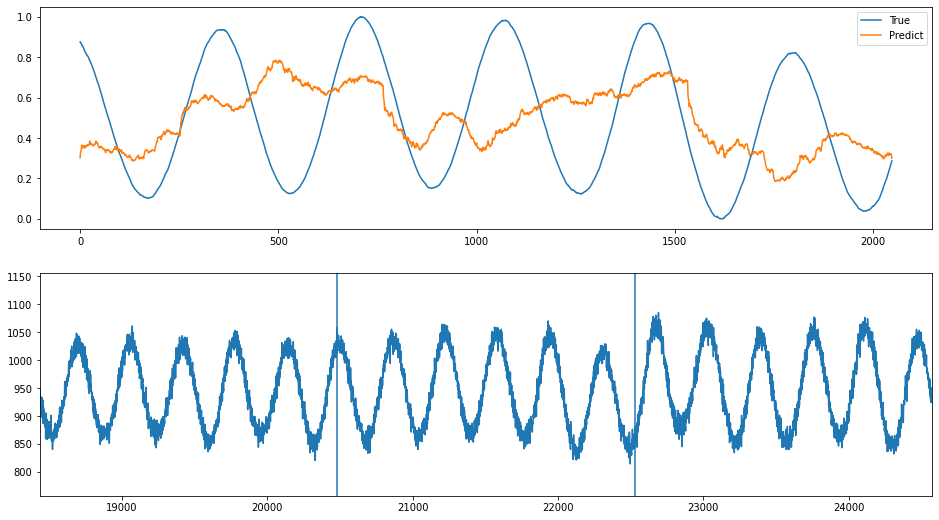

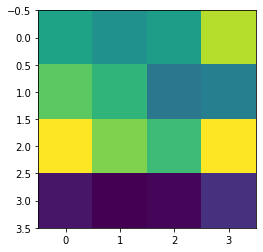

index: 89202
Error: 0.0938626146484623
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          27
Name: 7061, dtype: object


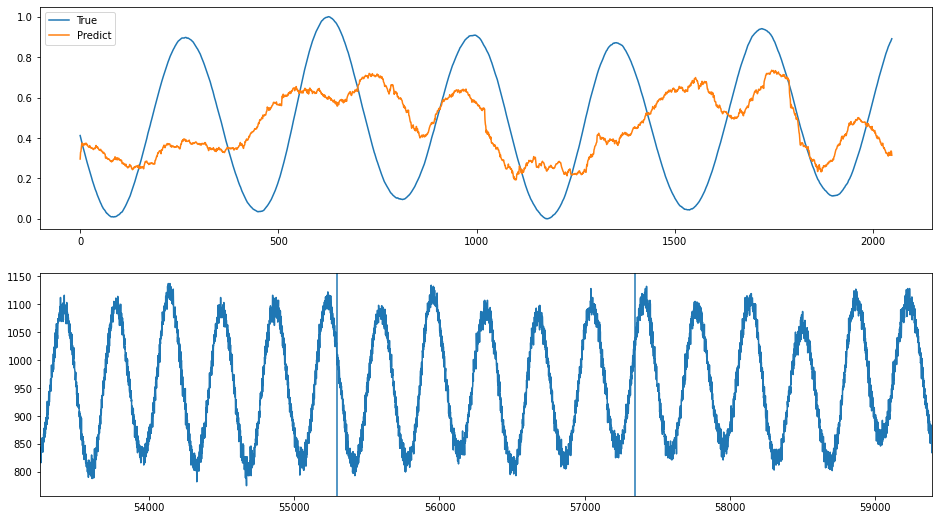

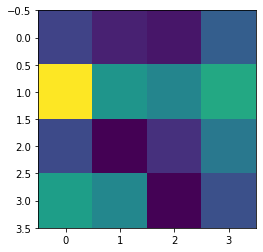

index: 20871
Error: 0.09364716498683515
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          22
Name: 5766, dtype: object


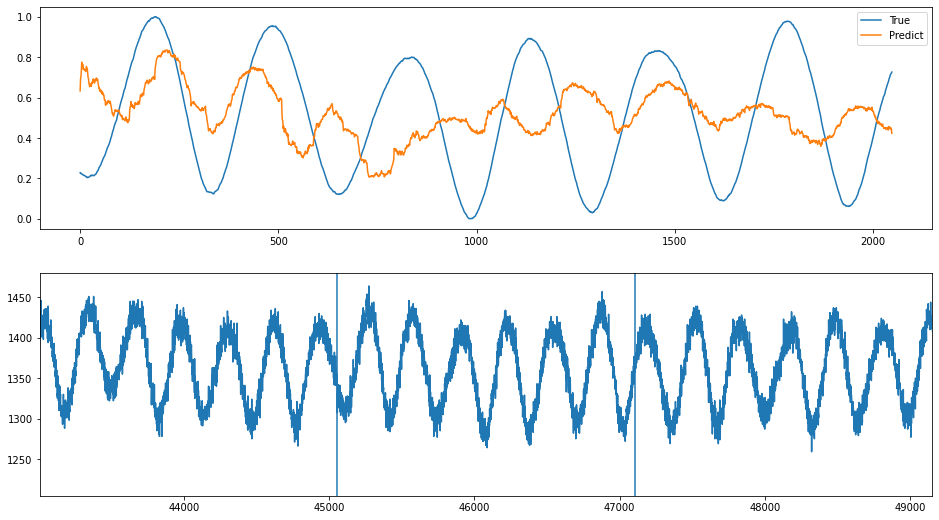

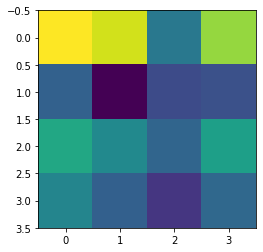

index: 94429
Error: 0.09230677333416216
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           4
Name: 1173, dtype: object


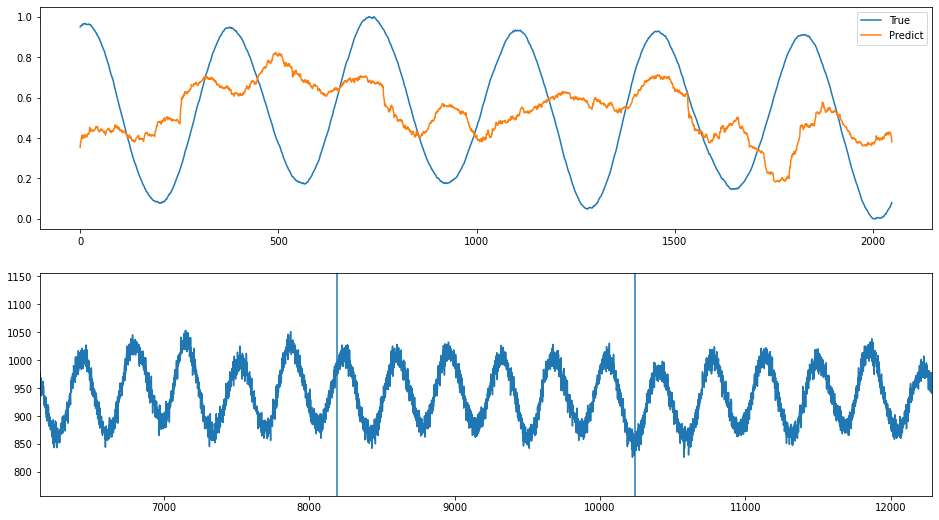

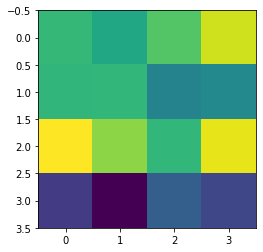

index: 23069
Error: 0.09188941636503056
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          10
Name: 2694, dtype: object


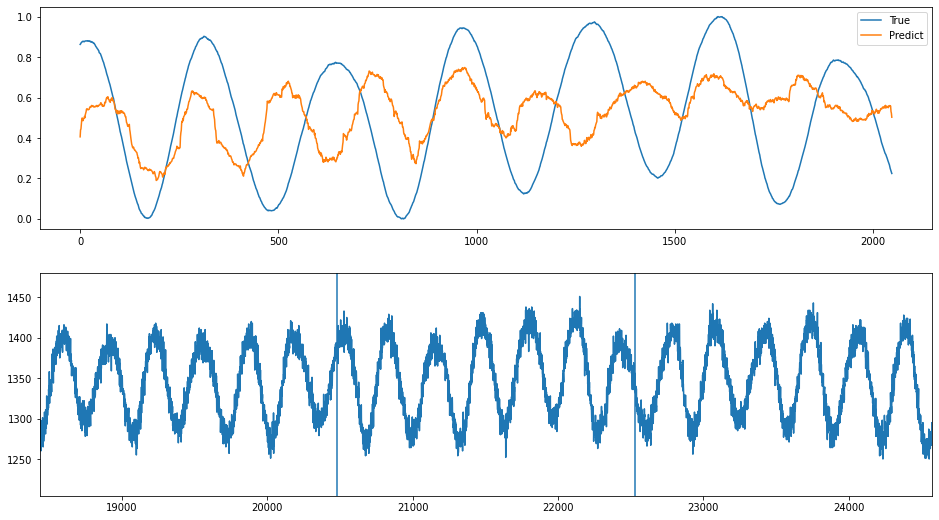

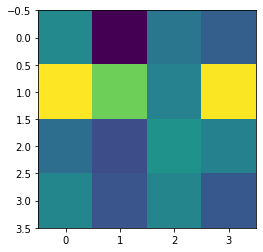

index: 92540
Error: 0.09174199696107034
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          21
Name: 5525, dtype: object


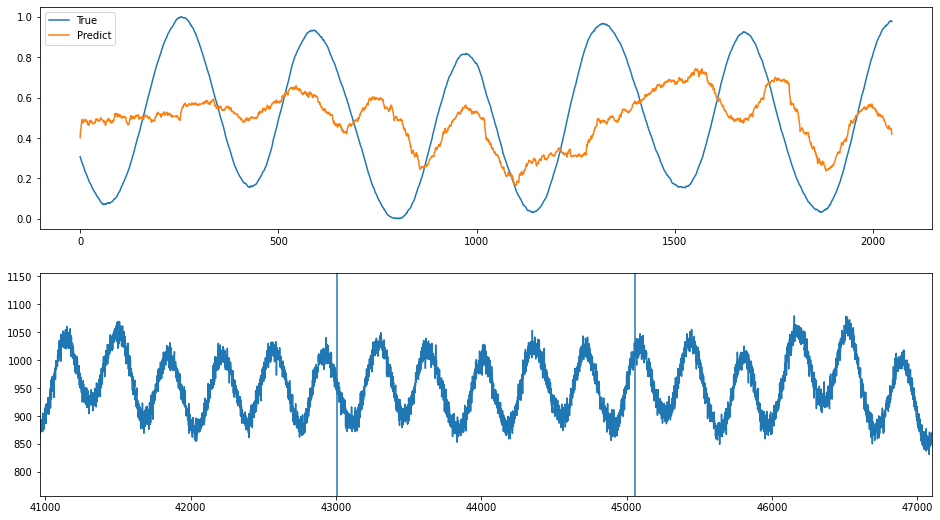

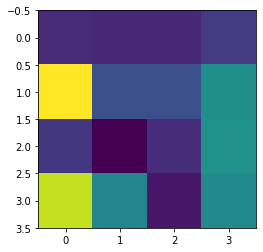

index: 18627
Error: 0.09168186834555904
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          30
Name: 7814, dtype: object


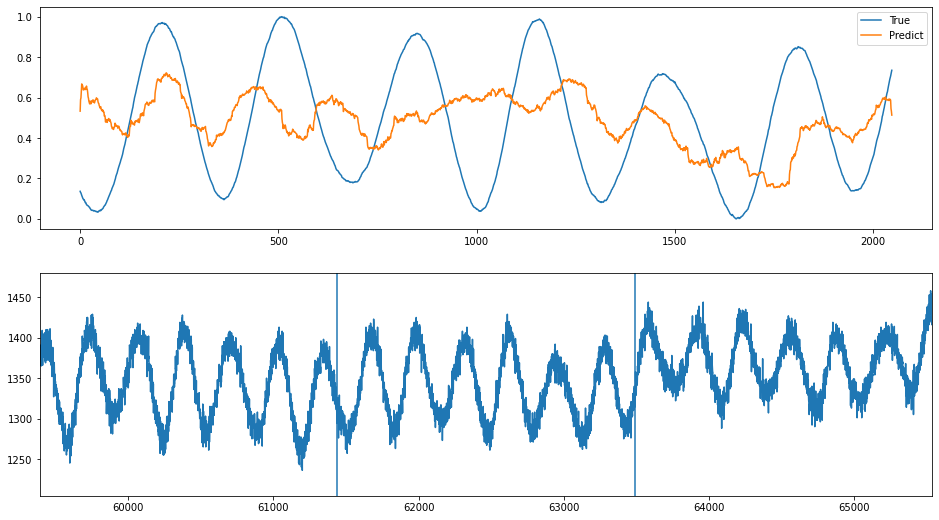

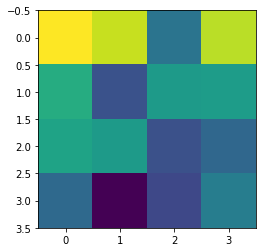

index: 92383
Error: 0.09144199333219652
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          13
Name: 3477, dtype: object


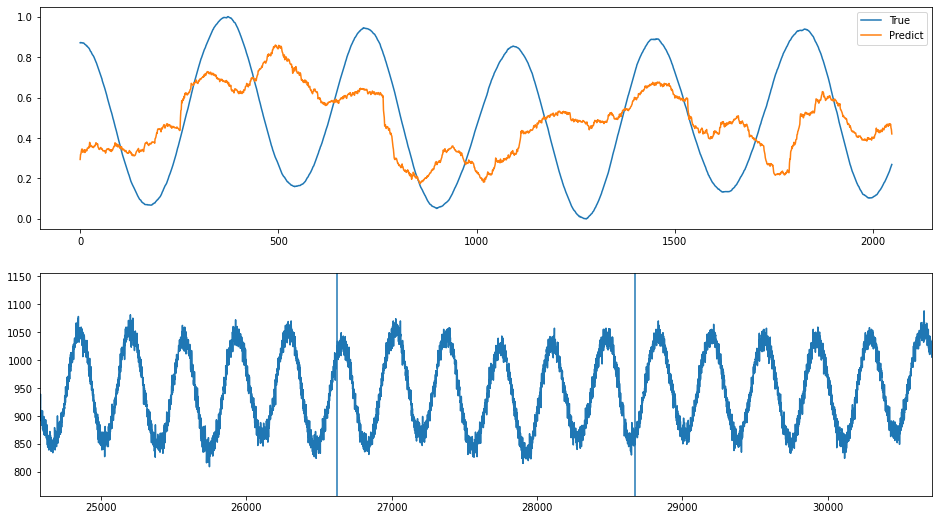

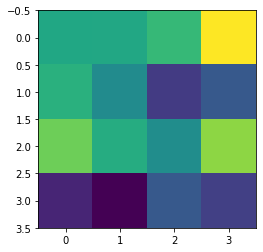

index: 22597
Error: 0.09111969443188887
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          28
Name: 7302, dtype: object


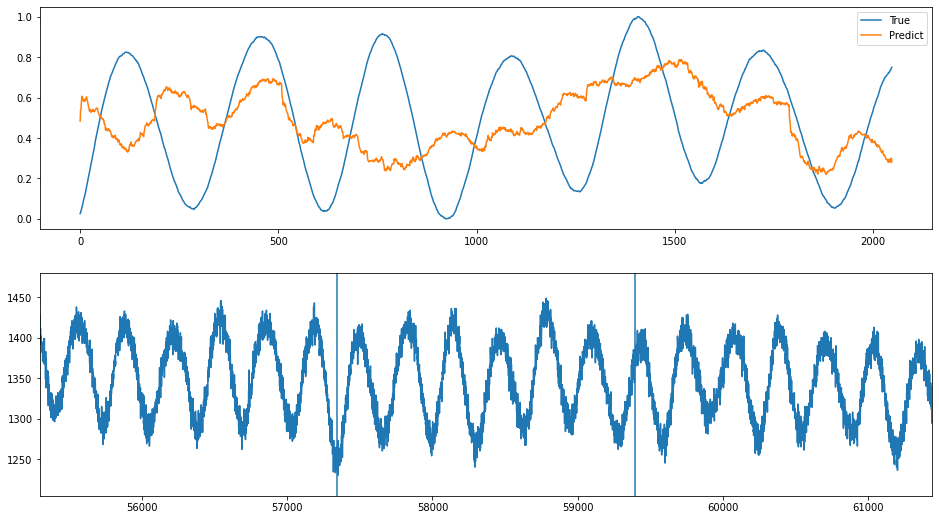

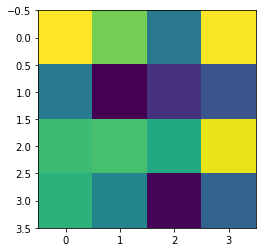

index: 156020
Error: 0.09106430886394451
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   287
bunch_number                                                   97
ts_length                                                   65536
chunk                                                           6
Name: 1675, dtype: object


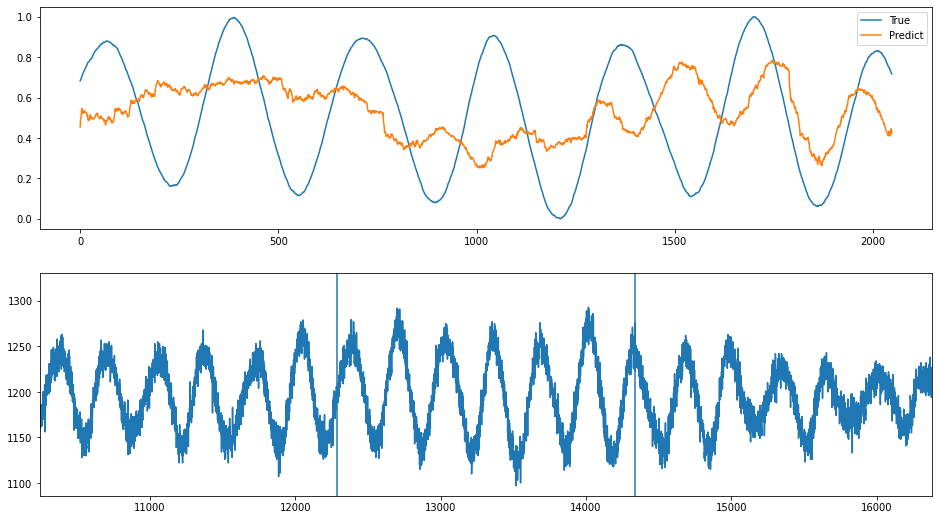

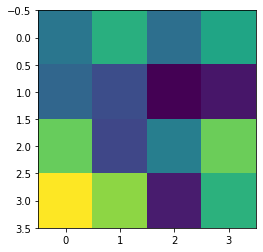

index: 19728
Error: 0.09096994121419696
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                           6
Name: 1670, dtype: object


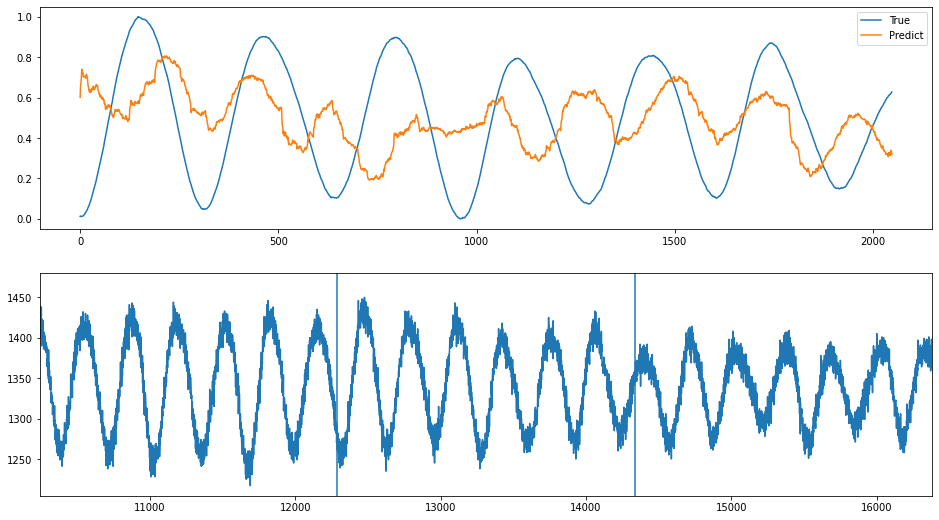

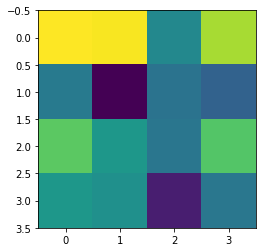

index: 19133
Error: 0.09049264554771519
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                           7
Name: 1926, dtype: object


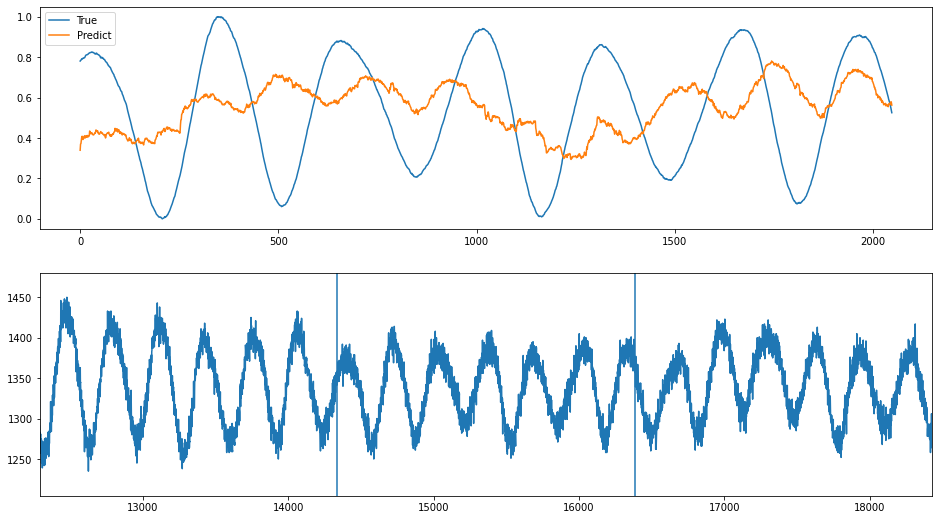

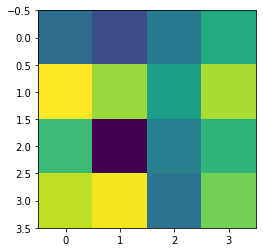

index: 93152
Error: 0.09046884448645803
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          30
Name: 7829, dtype: object


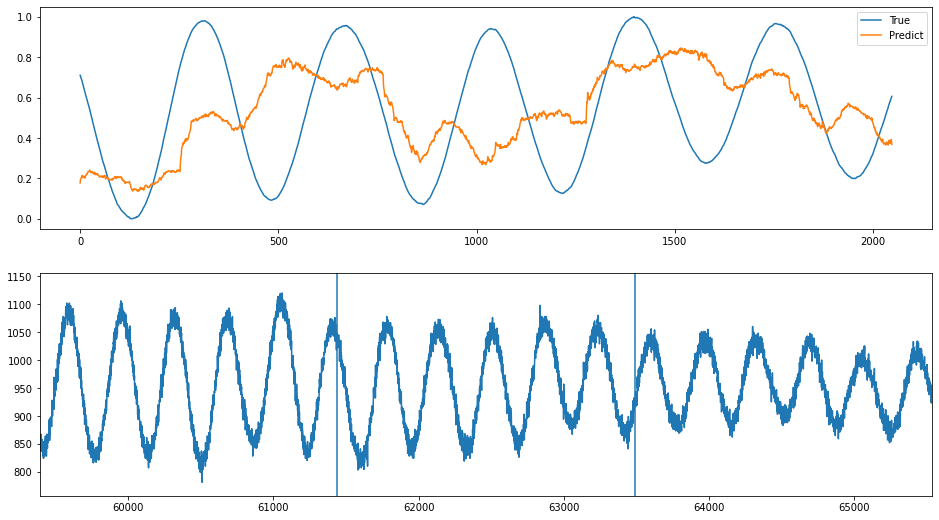

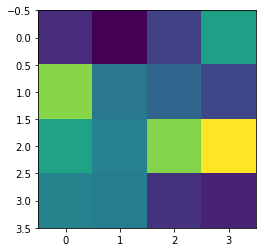

index: 20042
Error: 0.08999172900061743
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          11
Name: 2950, dtype: object


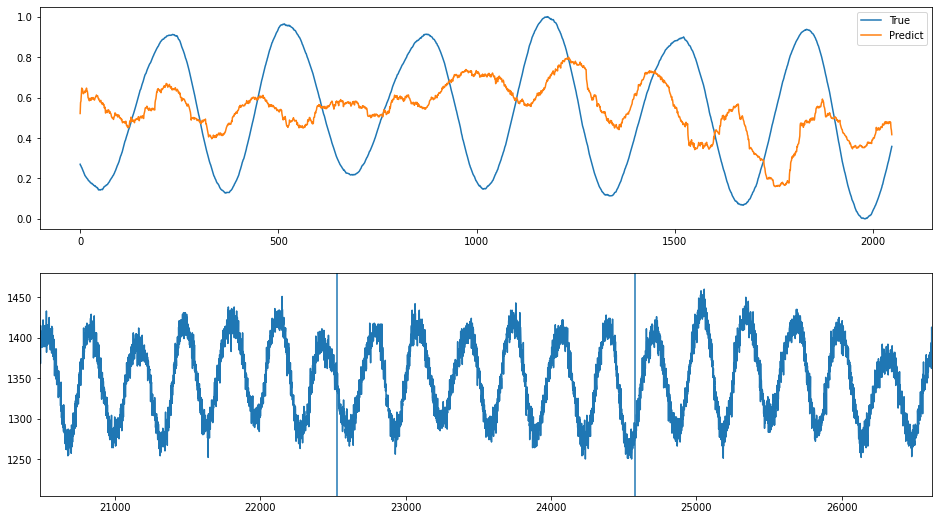

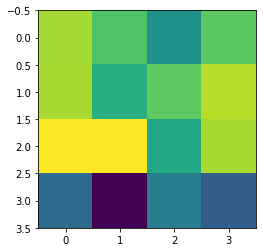

index: 16647
Error: 0.0885664730275695
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          17
Name: 4486, dtype: object


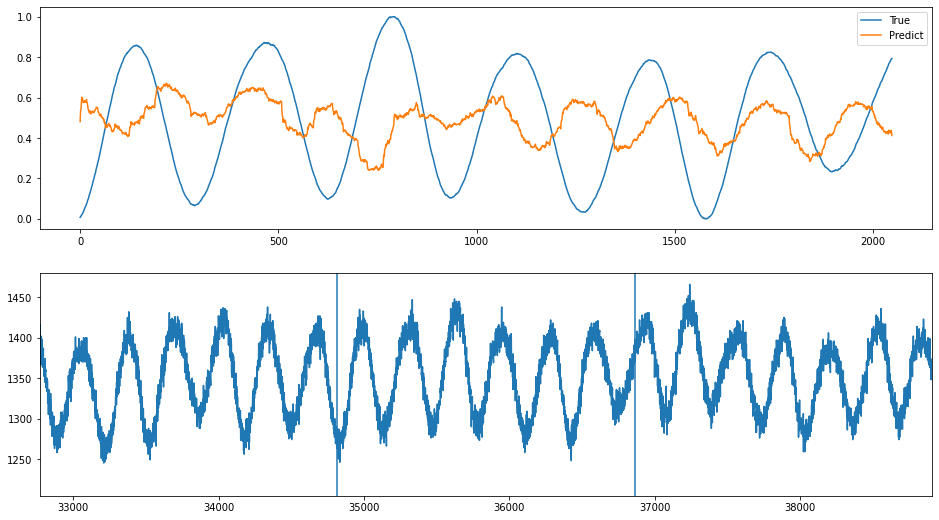

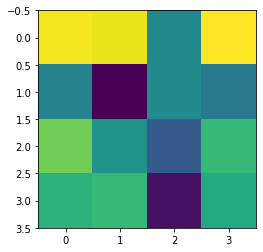

index: 93026
Error: 0.08704520039740046
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           7
Name: 1941, dtype: object


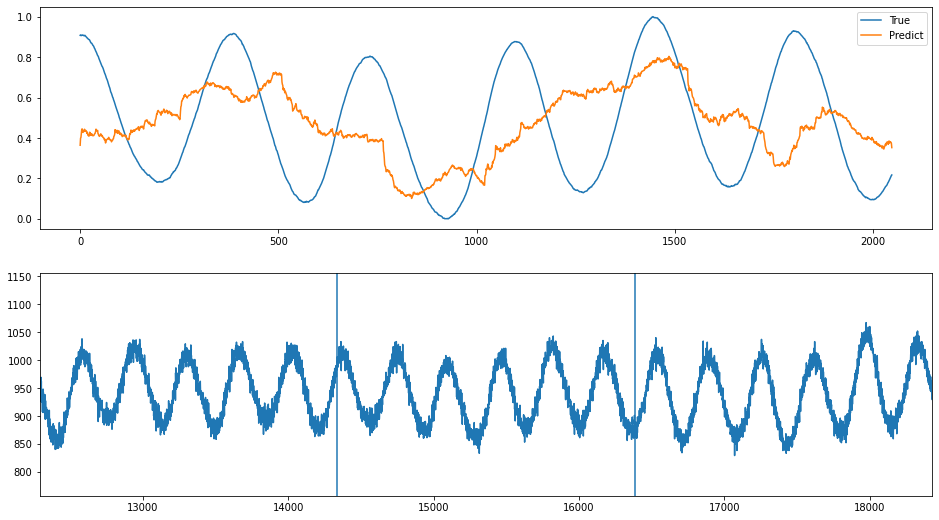

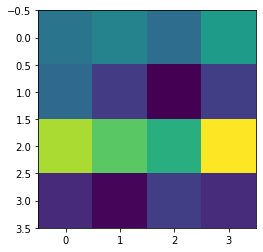

index: 90513
Error: 0.08483424897427191
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           5
Name: 1429, dtype: object


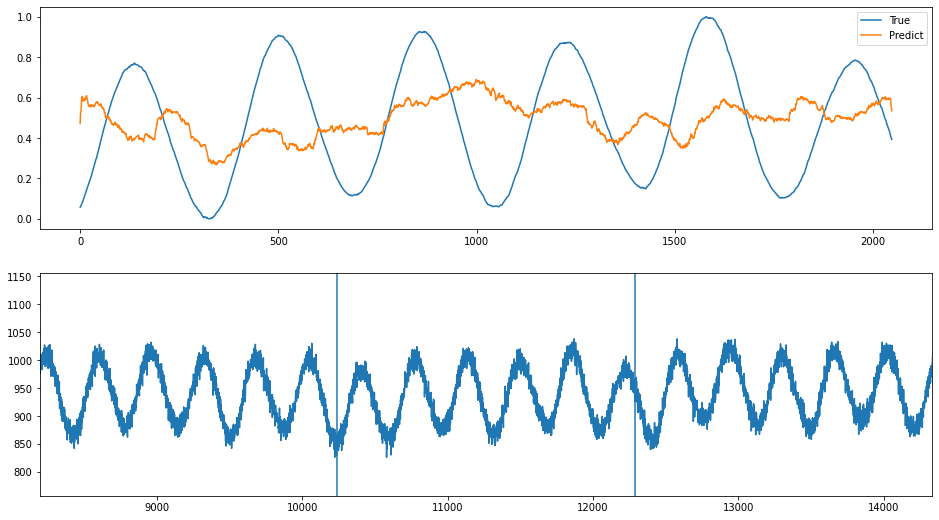

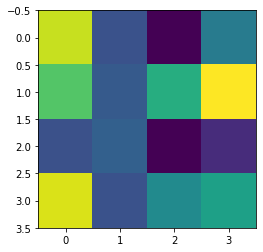

index: 21712
Error: 0.08450213640745807
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          24
Name: 6278, dtype: object


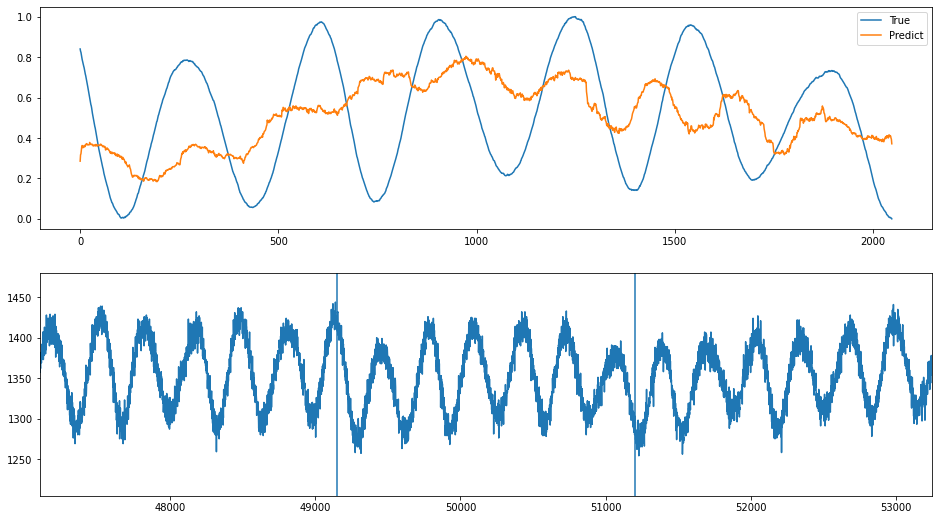

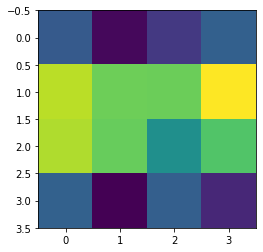

index: 18997
Error: 0.0844114546653223
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          21
Name: 5510, dtype: object


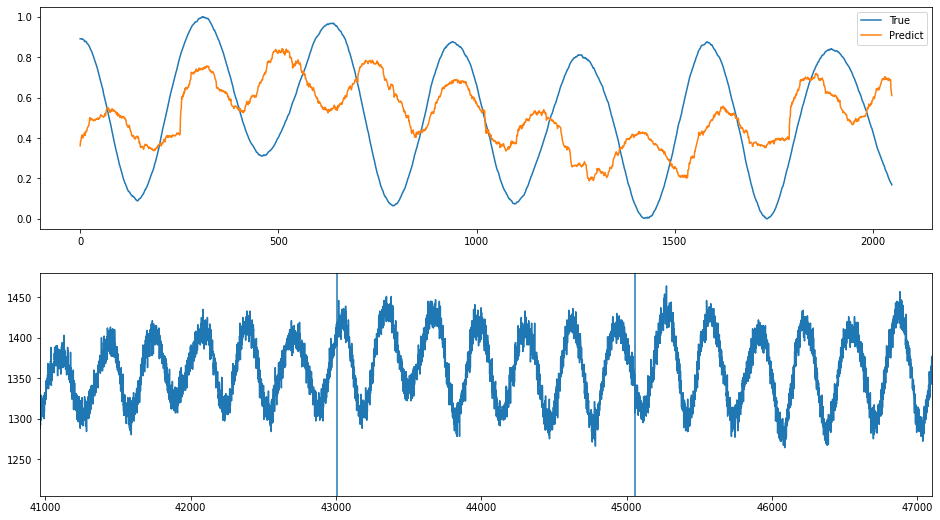

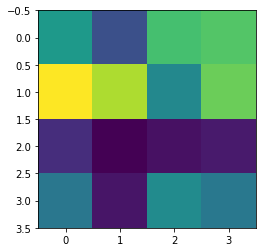

index: 156108
Error: 0.08401254638498099
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   287
bunch_number                                                   97
ts_length                                                   65536
chunk                                                           5
Name: 1419, dtype: object


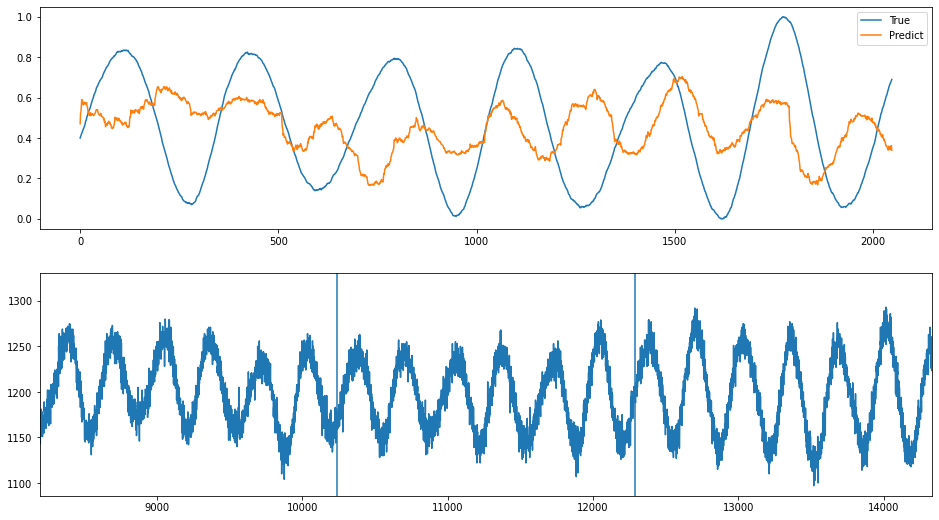

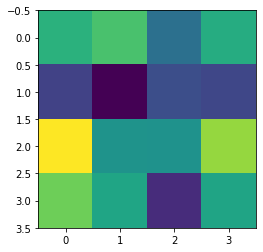

index: 90479
Error: 0.0827239056074903
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                           3
Name: 917, dtype: object


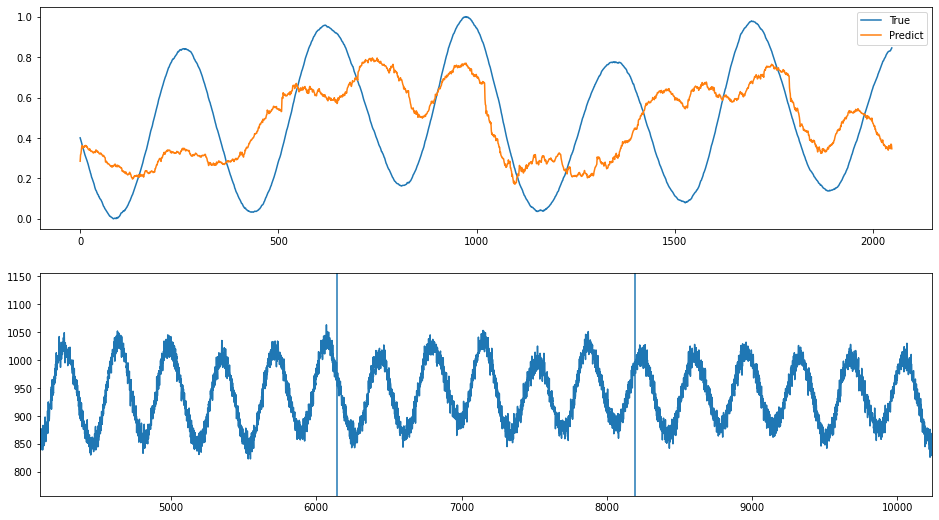

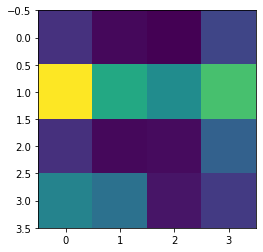

index: 23431
Error: 0.08254357270846287
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          12
Name: 3206, dtype: object


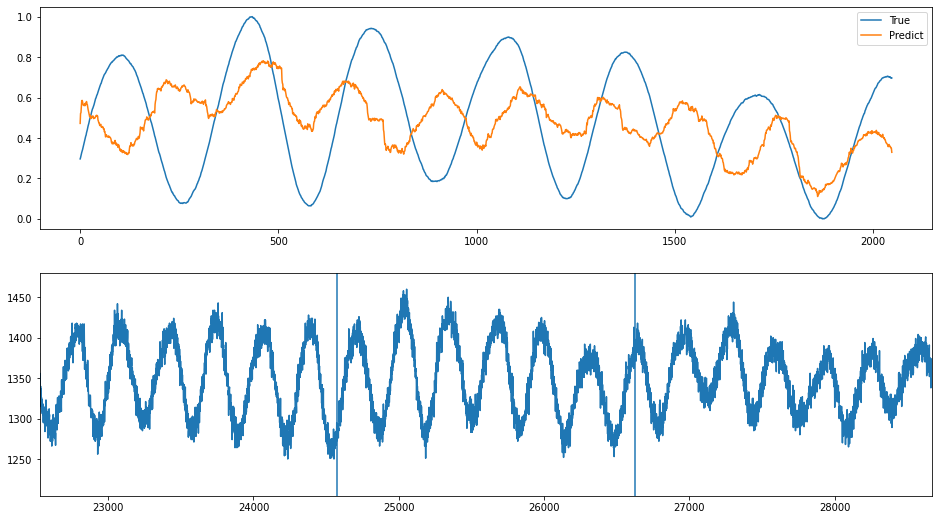

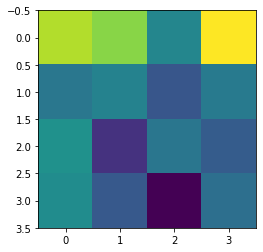

index: 156549
Error: 0.08235240651318651
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   287
bunch_number                                                   97
ts_length                                                   65536
chunk                                                           9
Name: 2443, dtype: object


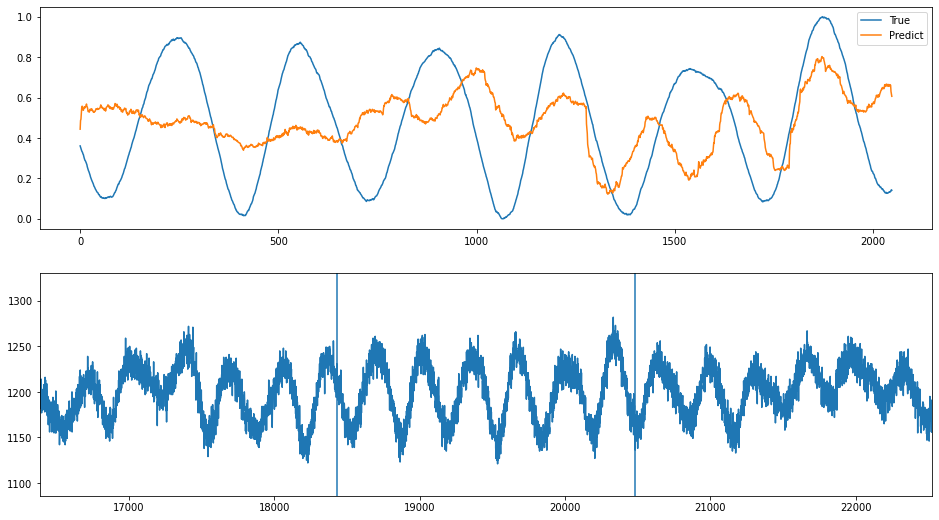

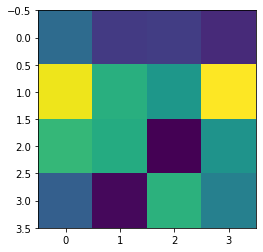

index: 166157
Error: 0.08224386471763342
type                                                         Inst
fill                                                         6798
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 03:24:49
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6798/...
n_bunches                                                     158
bunch_index                                                   317
bunch_number                                                   96
ts_length                                                   65536
chunk                                                          23
Name: 5900, dtype: object


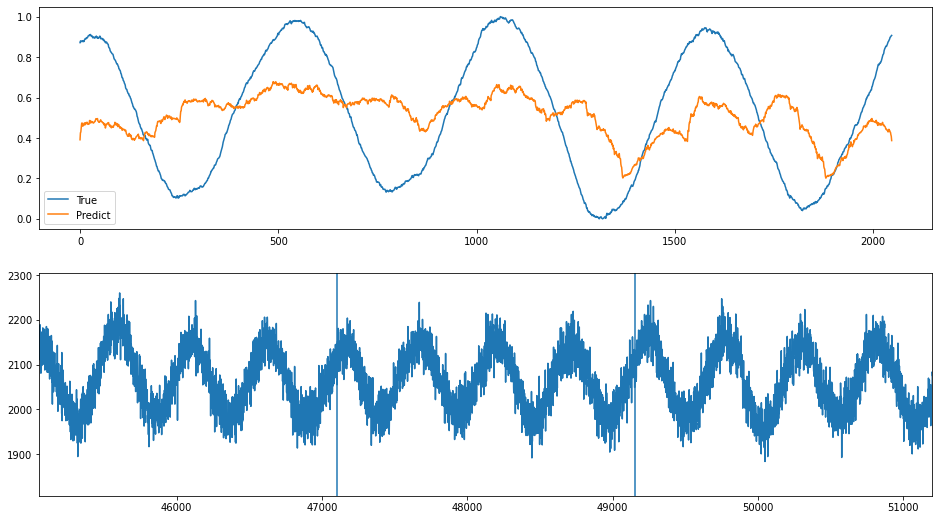

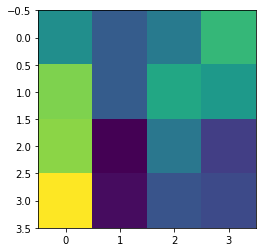

index: 155866
Error: 0.08218076022052202
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   287
bunch_number                                                   97
ts_length                                                   65536
chunk                                                          17
Name: 4491, dtype: object


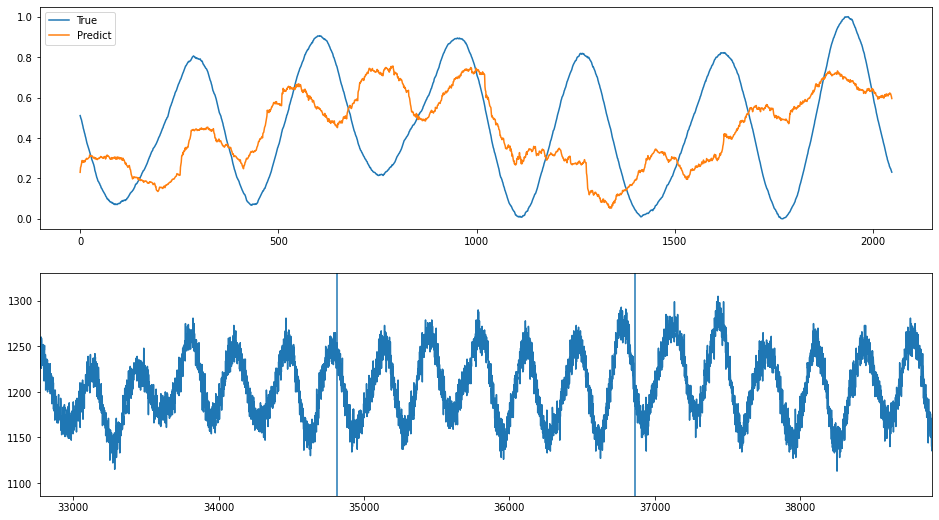

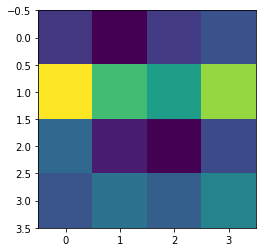

index: 21973
Error: 0.08176950519435973
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          15
Name: 3974, dtype: object


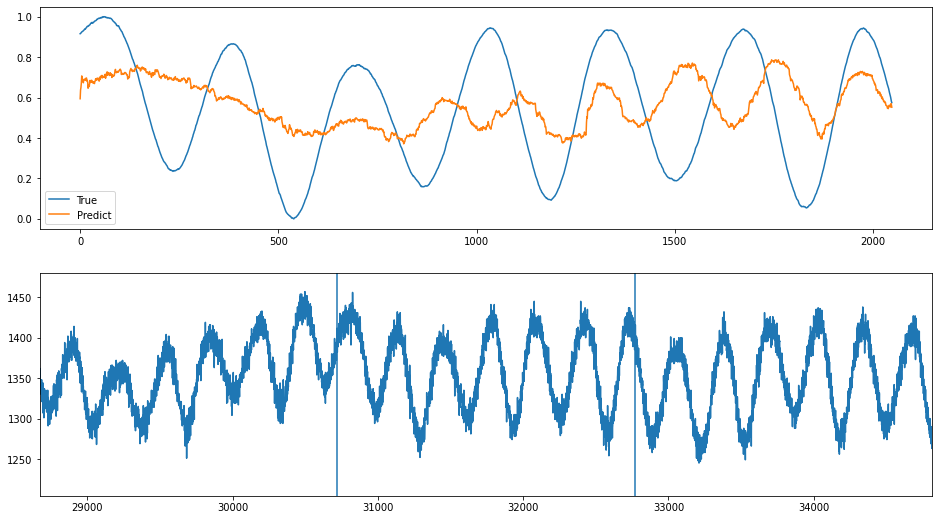

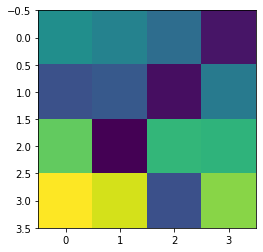

index: 23676
Error: 0.08116108841891334
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          29
Name: 7558, dtype: object


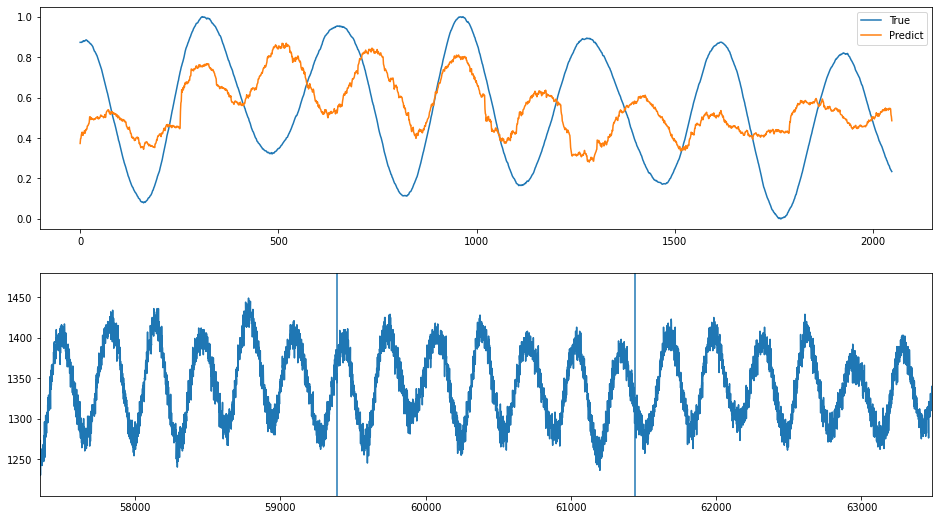

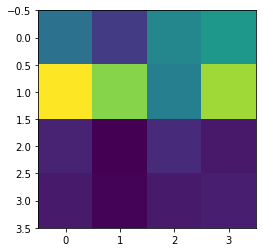

index: 371719
Error: 0.08110377058478624
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 22:57:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  1690
bunch_number                                                  926
ts_length                                                   65536
chunk                                                          19
Name: 5092, dtype: object


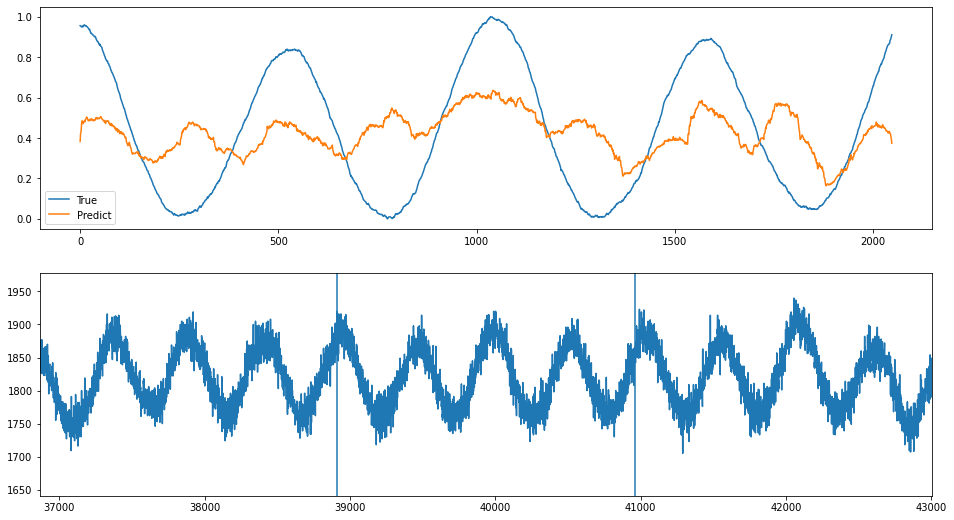

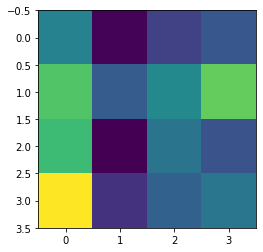

index: 90113
Error: 0.08071558549438332
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   691
bunch_number                                                  404
ts_length                                                   65536
chunk                                                          24
Name: 6293, dtype: object


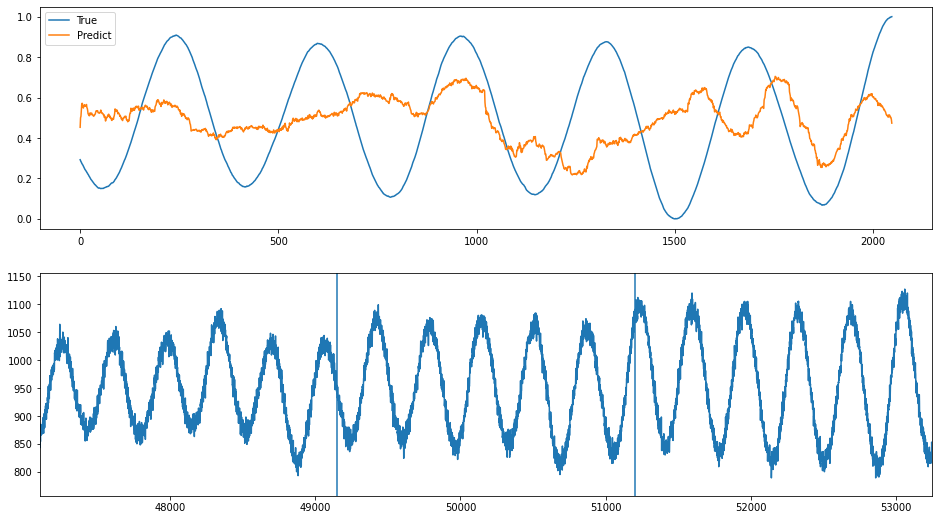

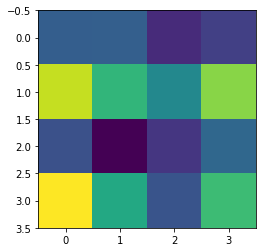

index: 335971
Error: 0.08002662436114936
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-30 00:40:33
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                   962
bunch_number                                                  522
ts_length                                                   65536
chunk                                                           8
Name: 2052, dtype: object


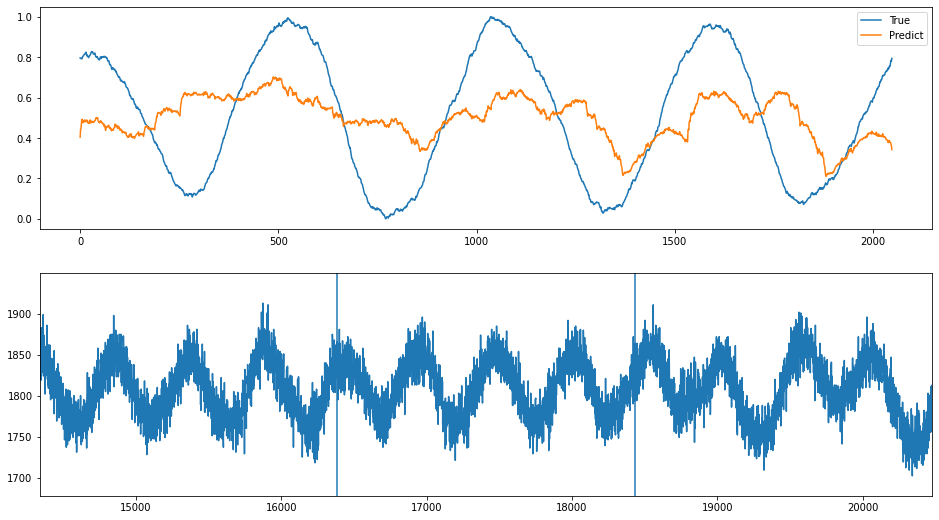

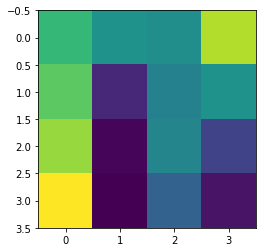

index: 18461
Error: 0.07978900859774143
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          20
Name: 5254, dtype: object


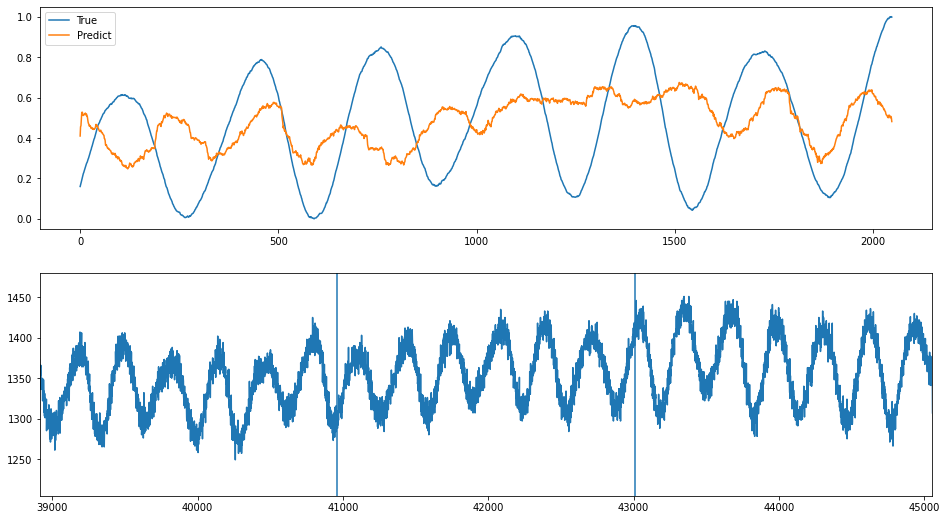

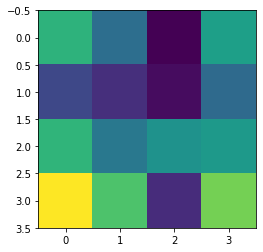

index: 17089
Error: 0.07933034570778376
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   669
bunch_number                                                  389
ts_length                                                   65536
chunk                                                          16
Name: 4230, dtype: object


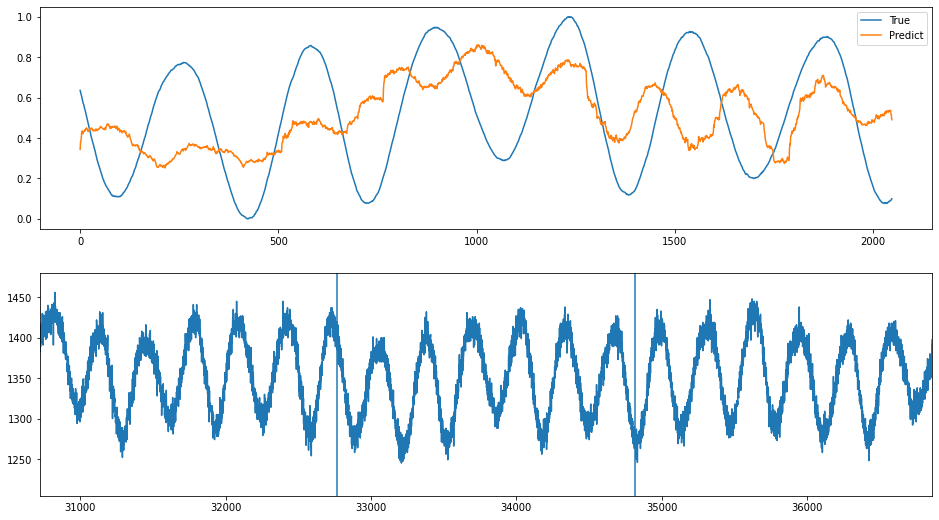

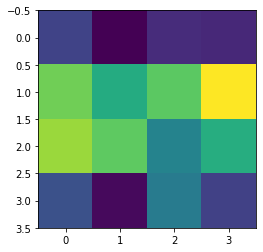

In [26]:
for i in range(1, 51):
    index = sorted_error_indices[-i]
    plot_train_index(index)

# Around the peak

In [27]:
error_around_peak = abs(train_error - hist_peak)
sorted_error_indices_around_peak = np.argsort(error_around_peak)

index: 28816
Error: 0.0031375327798313993
type                                                         Inst
fill                                                         6279
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-07 11:54:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6279/...
n_bunches                                                    1868
bunch_index                                                  3377
bunch_number                                                 1825
ts_length                                                   65536
chunk                                                           8
Name: 2179, dtype: object


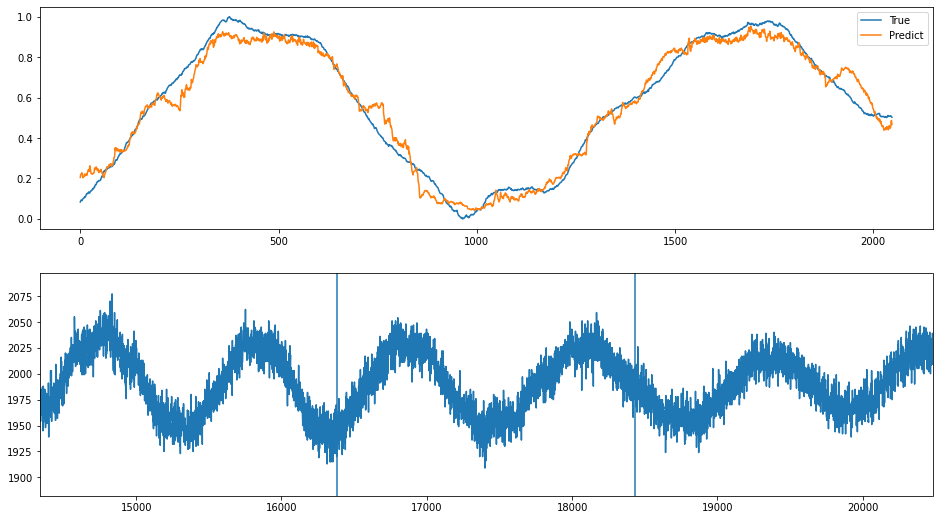

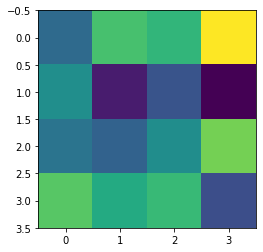

index: 111108
Error: 0.0031375314793060096
type                                                         Inst
fill                                                         6272
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-05 03:27:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/...
n_bunches                                                    1836
bunch_index                                                   834
bunch_number                                                  432
ts_length                                                   65536
chunk                                                          27
Name: 7167, dtype: object


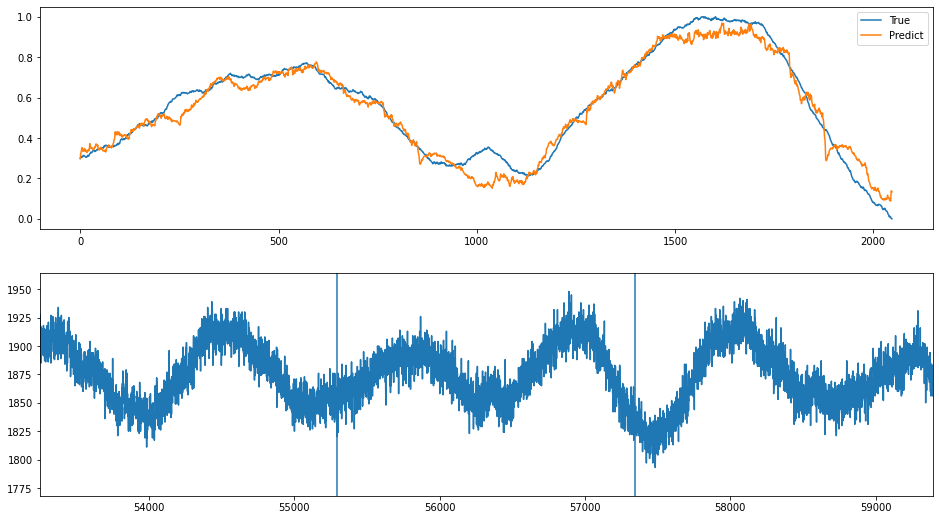

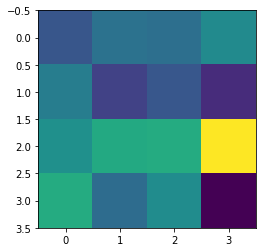

index: 88183
Error: 0.003137529586821103
type                                                         Inst
fill                                                         7319
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-19 13:54:37
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7319/...
n_bunches                                                     924
bunch_index                                                   983
bunch_number                                                  712
ts_length                                                   65536
chunk                                                          24
Name: 6362, dtype: object


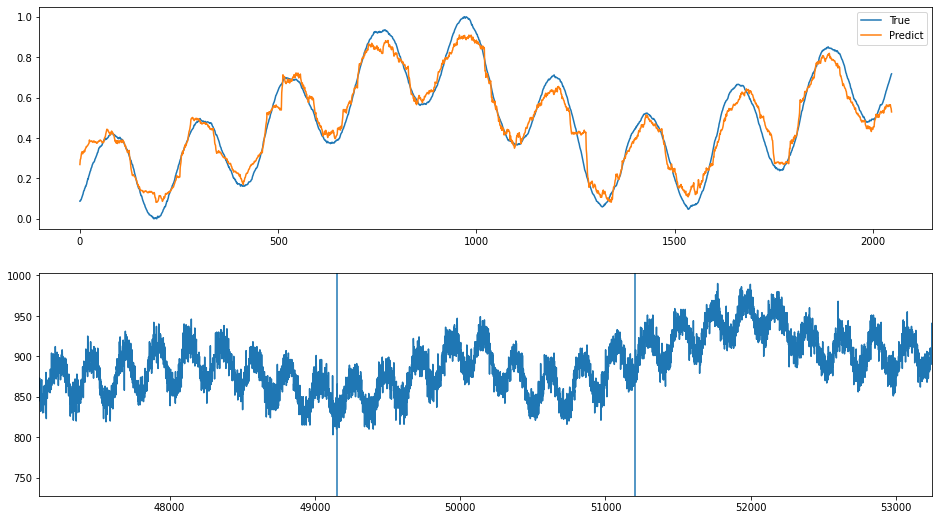

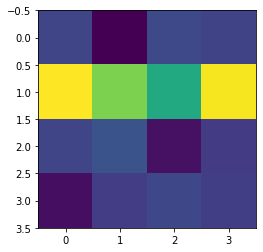

index: 359488
Error: 0.003137538602515256
type                                                         Inst
fill                                                         6685
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-15 08:57:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6685/...
n_bunches                                                     204
bunch_index                                                  1644
bunch_number                                                  160
ts_length                                                   65536
chunk                                                           5
Name: 1500, dtype: object


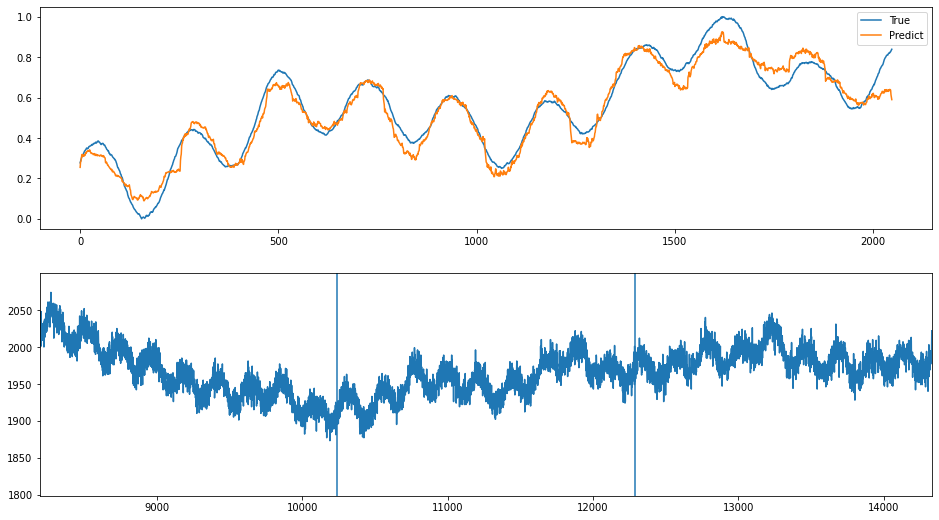

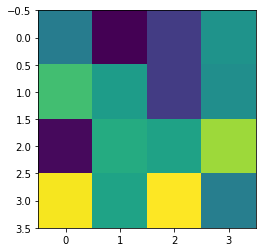

index: 377268
Error: 0.003137540043575206
type                                                         Inst
fill                                                         6246
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-27 04:43:16
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6246/...
n_bunches                                                     292
bunch_index                                                   178
bunch_number                                                   81
ts_length                                                   65536
chunk                                                          26
Name: 6756, dtype: object


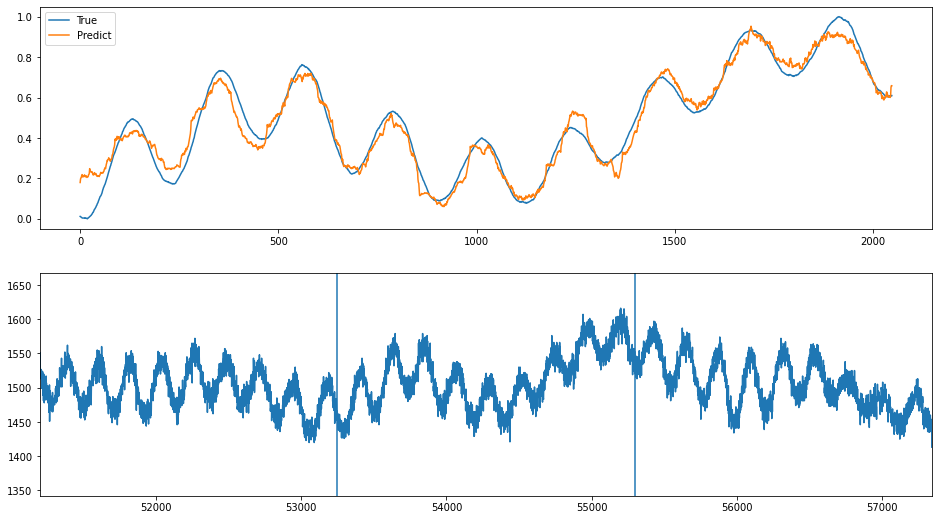

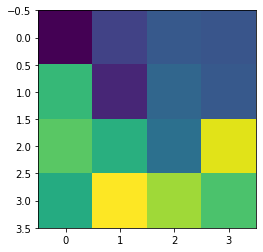

index: 282219
Error: 0.003137541095960479
type                                                         Inst
fill                                                         7468
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-23 20:22:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7468/...
n_bunches                                                     733
bunch_index                                                  2076
bunch_number                                                  437
ts_length                                                   65536
chunk                                                           3
Name: 821, dtype: object


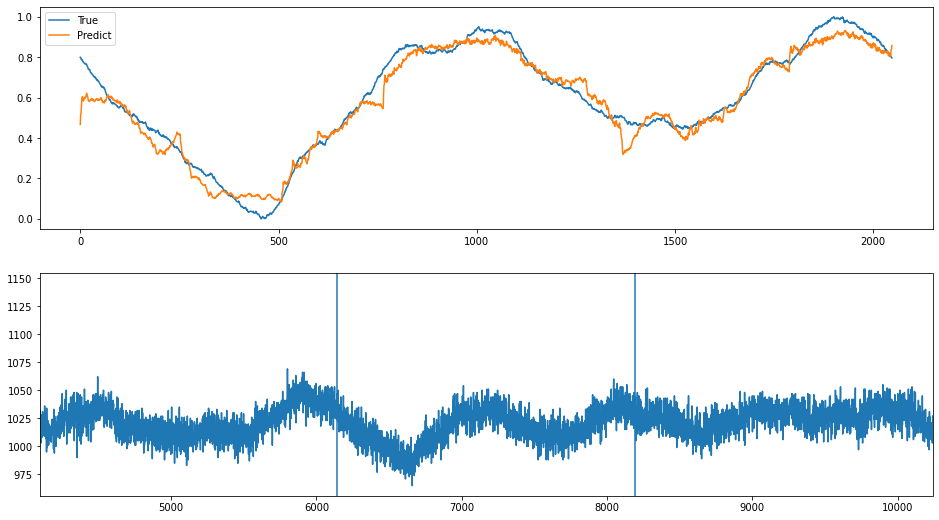

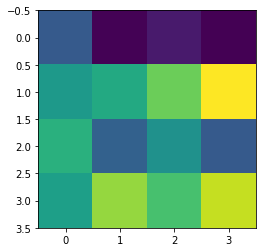

index: 119124
Error: 0.0031375261997960433
type                                                         Inst
fill                                                         6757
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-04 04:15:41
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6757/...
n_bunches                                                     252
bunch_index                                                   144
bunch_number                                                   69
ts_length                                                   65536
chunk                                                          17
Name: 4499, dtype: object


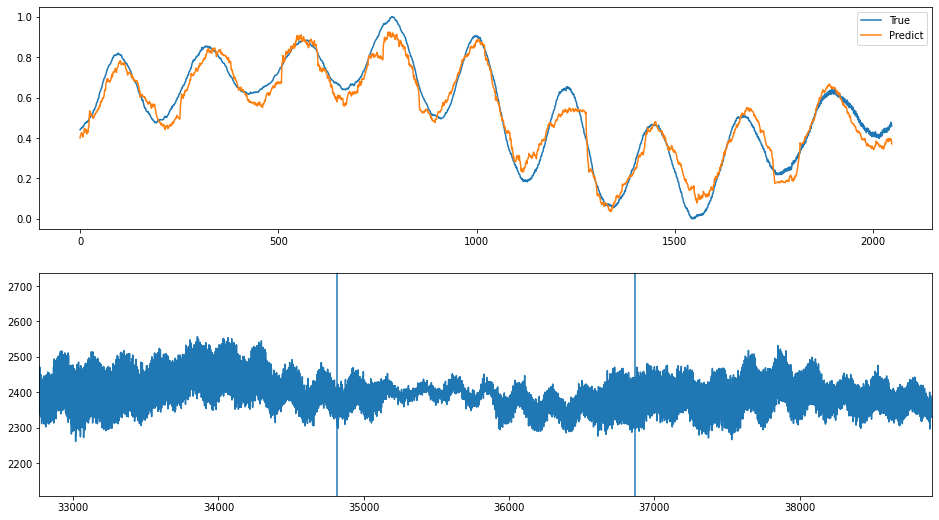

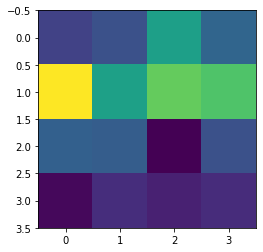

index: 23142
Error: 0.003137520238767154
type                                                         Inst
fill                                                         6449
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 06:41:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6449/...
n_bunches                                                     252
bunch_index                                                   728
bunch_number                                                   98
ts_length                                                   65536
chunk                                                           6
Name: 1667, dtype: object


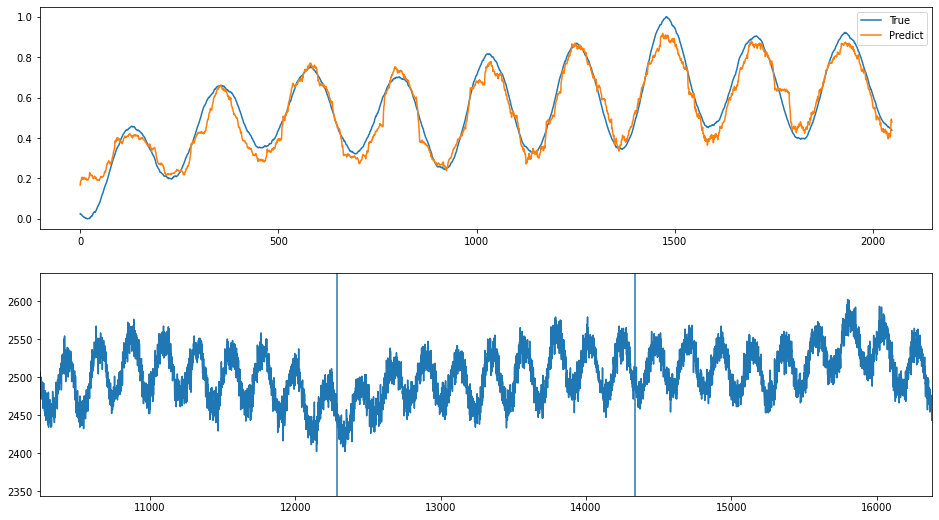

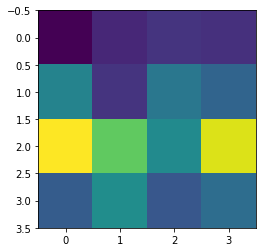

index: 145217
Error: 0.0031375197024432703
type                                                         Inst
fill                                                         6688
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-15 23:46:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6688/...
n_bunches                                                     987
bunch_index                                                  2007
bunch_number                                                  549
ts_length                                                   65536
chunk                                                           7
Name: 1956, dtype: object


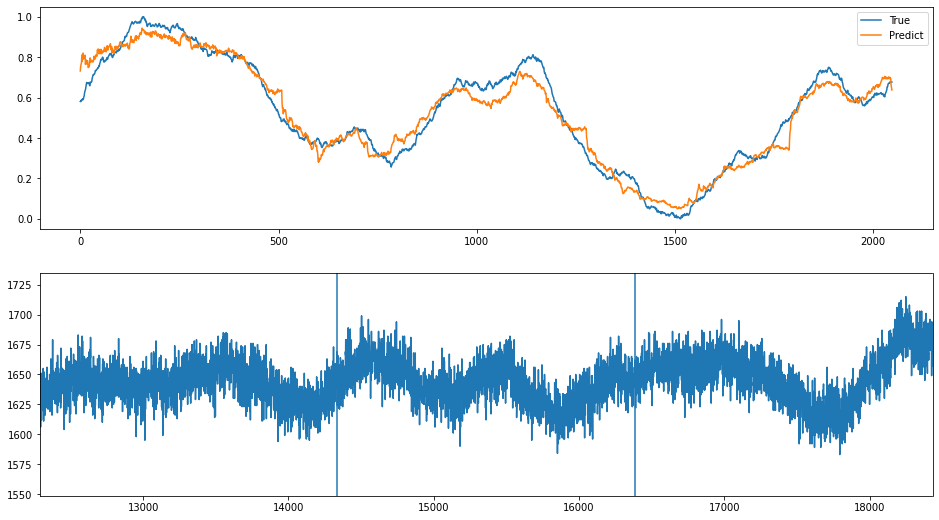

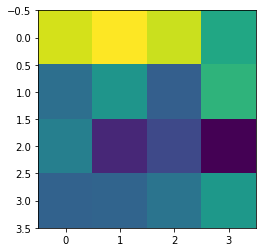

index: 396655
Error: 0.003137554239410734
type                                                         Inst
fill                                                         6394
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-16 17:38:25
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6394/...
n_bunches                                                     876
bunch_index                                                   254
bunch_number                                                  107
ts_length                                                   65536
chunk                                                          14
Name: 3743, dtype: object


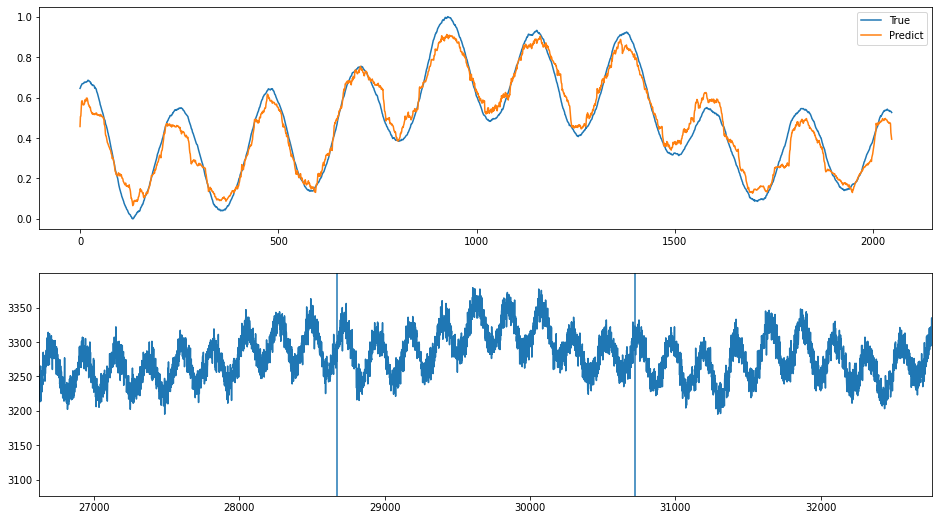

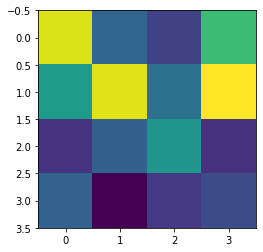

In [28]:
for i in range(10):
    index = sorted_error_indices_around_peak[i]
    plot_train_index(index)

# Around a point

In [29]:
# point = 

In [30]:
# error_around_peak = abs(train_error - point)
# sorted_error_indices_around_point = np.argsort(error_around_peak)

In [31]:
# for i in range(10):
#     index = sorted_error_indices_around_point[i]
#     plot_train_index(index)

# Clustering

In [32]:
indices = sorted_error_indices[-np.arange(1, 1024+1)]
encoding_true = train_data[indices]
encoding_pred = train_prediction[indices]
encoding_meta = train_meta.iloc[indices]
try:
    encoded = checker.encode(encoding_true)
except:
    encoded = np.array(checker.encoder(encoding_true)).squeeze()
encoded_2d = encoded.reshape(encoded.shape[0], -1)

In [33]:
encoded_2d.shape

(1024, 16)

In [34]:
print(encoded_2d[0])

[2.4122183 2.8115988 2.0023613 3.236734  1.8509281 2.1990476 1.4581102
 1.6358567 3.1245377 1.1470566 2.940758  2.80746   5.0731854 4.1193075
 2.4654284 4.465064 ]


In [35]:
encoded_2d.min()

0.0

In [36]:
encoded_2d.max()

7.713887

In [69]:
def plot_clusters(cluster_indices):
    print(f"N samples: {len(cluster_indices)}")
    fig, axes = plt.subplots(encoding_true.shape[2], 1, figsize=(12, 3))
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    for i in range(encoding_true.shape[2]):
        axes[i].plot(encoding_true[cluster_indices][:,:, i].T, linewidth=0, marker=',', alpha=0.1)
#         axes[1].plot(encoding_true[cluster_indices][:,:, 1].T, linewidth=0, marker=',', alpha=0.1)
        return fig, axes

def plot_avg_encoding(cluster_indices):
    plt.imshow(encoded[cluster_indices].mean(axis=0))

In [70]:
import sklearn
from sklearn.manifold import TSNE

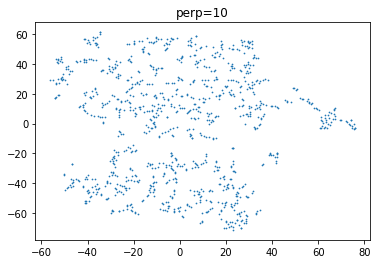

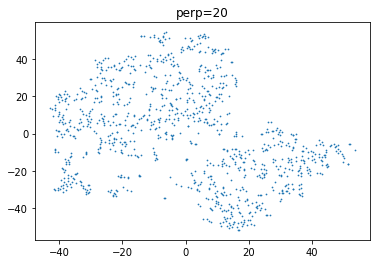

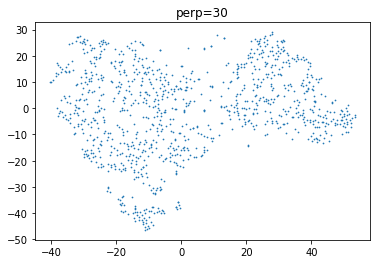

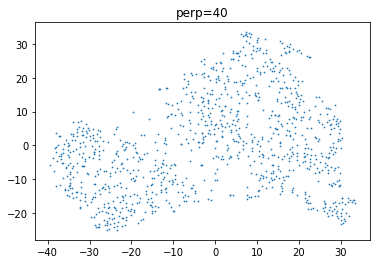

In [39]:
for perplexity in [10, 20, 30, 40]:
    tsne = TSNE(perplexity=perplexity)
    encoded_2d_tsne = tsne.fit_transform(encoded_2d)
    plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2)
    plt.title(f"perp={perplexity}")
    plt.show()

In [40]:
tsne = TSNE(perplexity=30)
encoded_2d_tsne = tsne.fit_transform(encoded_2d)

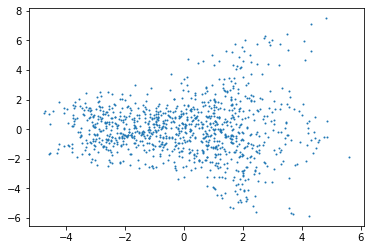

In [41]:
from sklearn.decomposition import PCA

pca = PCA(n_components=8)
encoded_2d_pca = pca.fit_transform(encoded_2d)
plt.scatter(encoded_2d_pca[:, 0], encoded_2d_pca[:, 1], marker='.', s=4)

In [42]:
pca.explained_variance_ratio_.sum()

0.9121672

In [71]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import matplotlib as mpl
mpl.style.use("default")

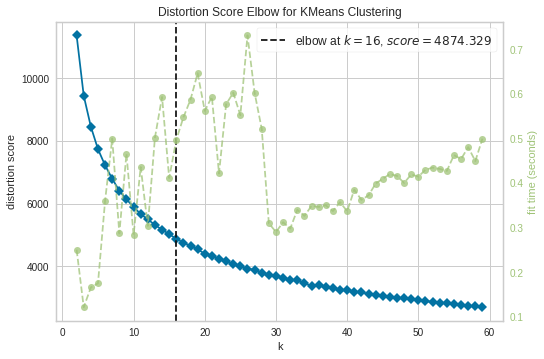

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [44]:
kmeans = KMeans()
viz = KElbowVisualizer(kmeans, k=(2, 60))
viz.fit(encoded_2d_pca)
viz.show()

-------------
n_clusters: 16
cluster 0
N samples: 71


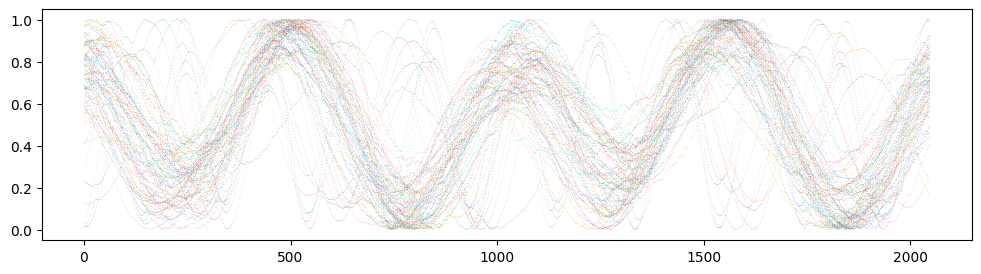

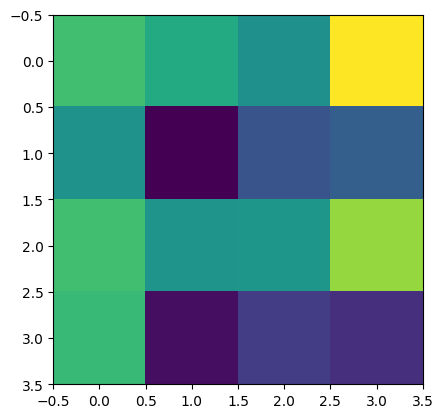

(71, 4, 4)
cluster 1
N samples: 117


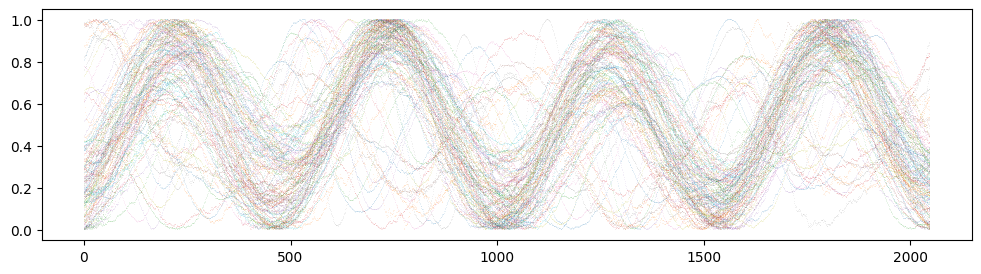

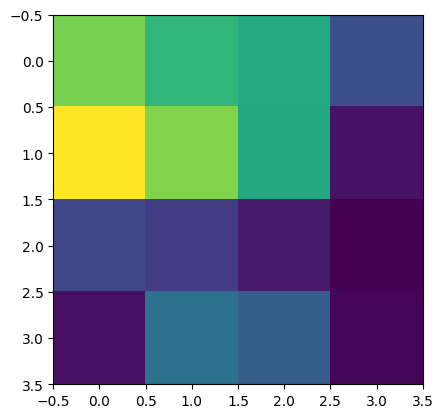

(117, 4, 4)
cluster 2
N samples: 39


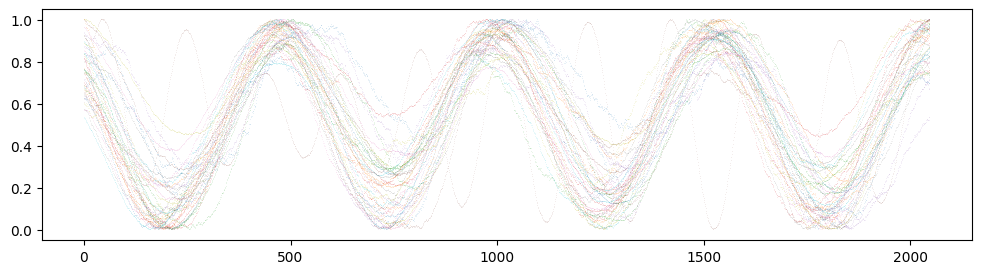

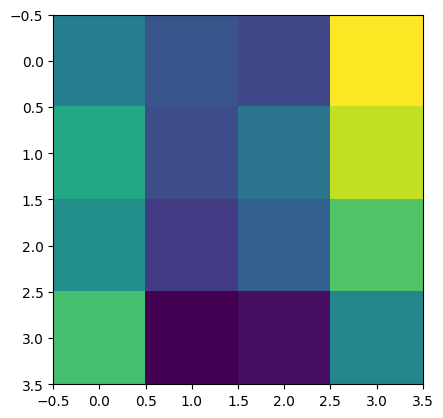

(39, 4, 4)
cluster 3
N samples: 56


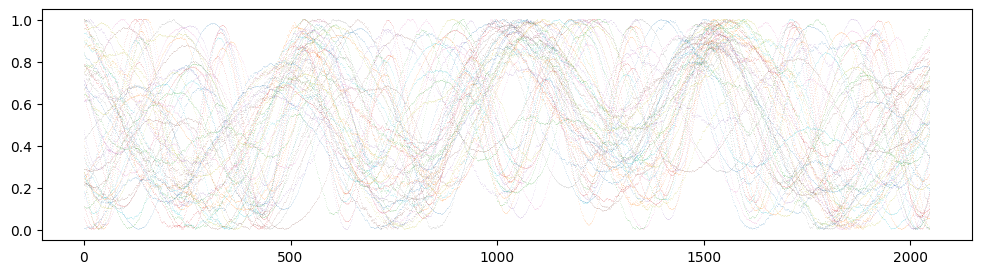

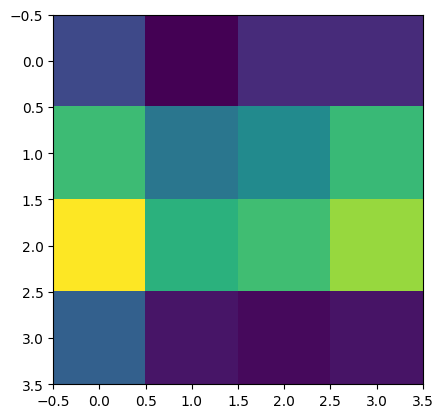

(56, 4, 4)
cluster 4
N samples: 79


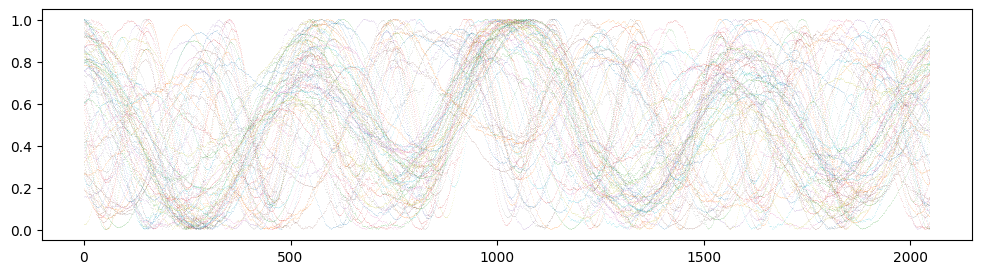

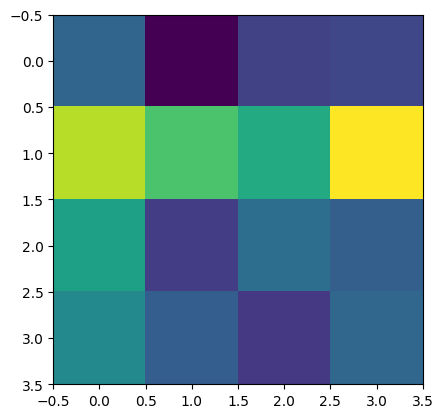

(79, 4, 4)
cluster 5
N samples: 85


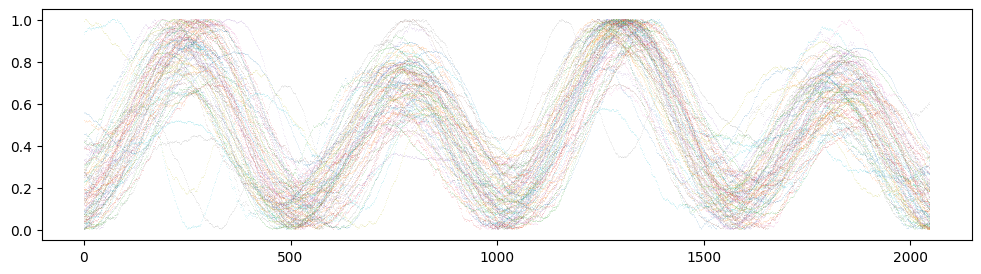

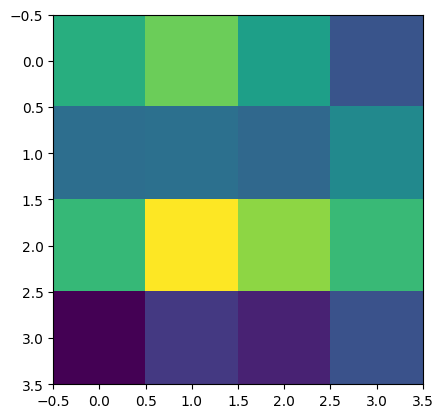

(85, 4, 4)
cluster 6
N samples: 33


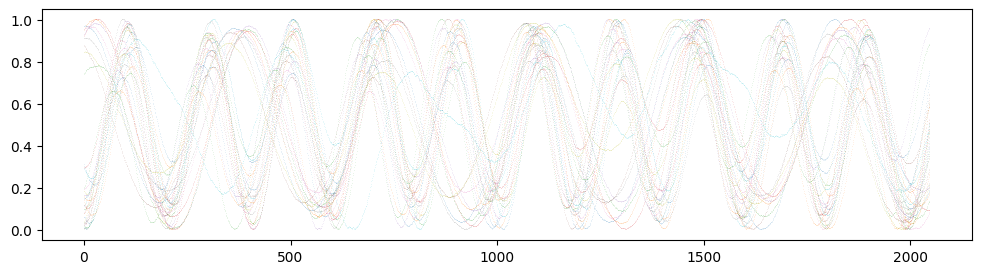

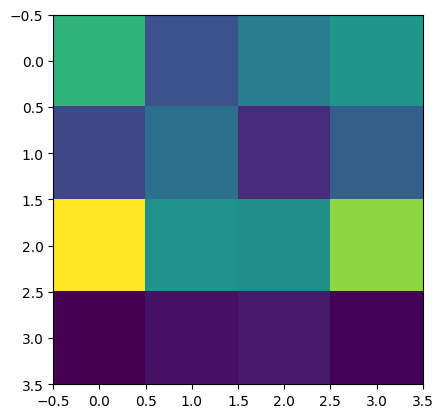

(33, 4, 4)
cluster 7
N samples: 46


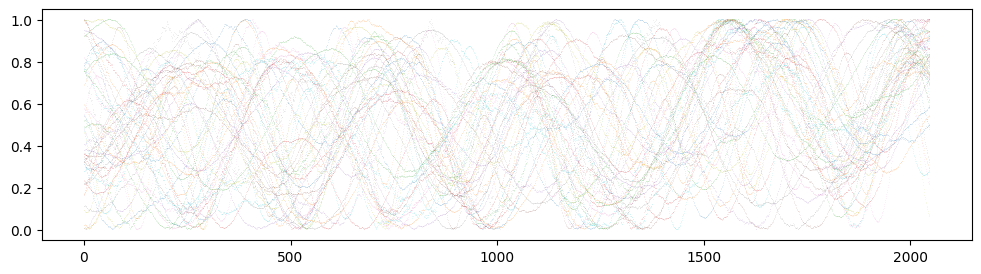

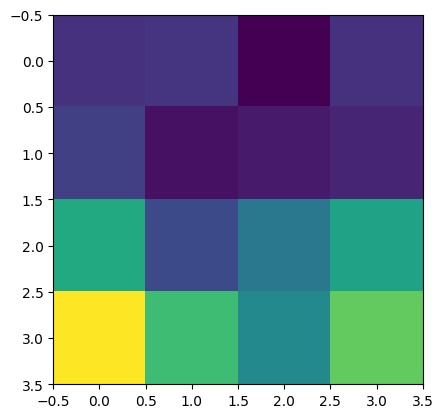

(46, 4, 4)
cluster 8
N samples: 103


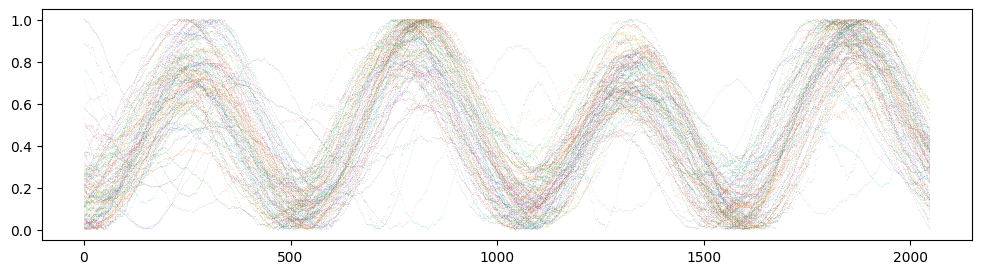

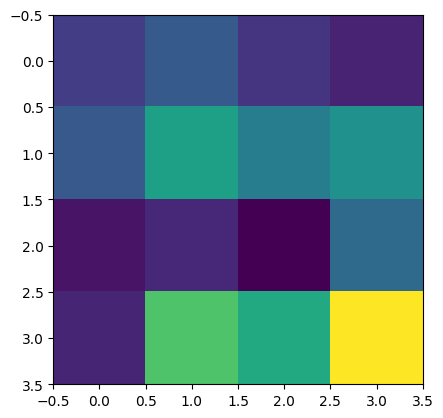

(103, 4, 4)
cluster 9
N samples: 26


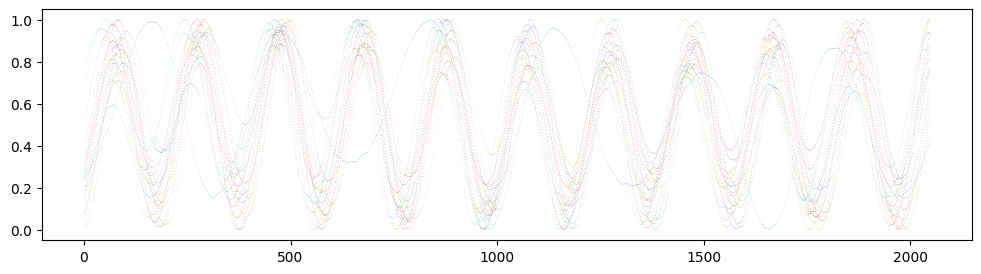

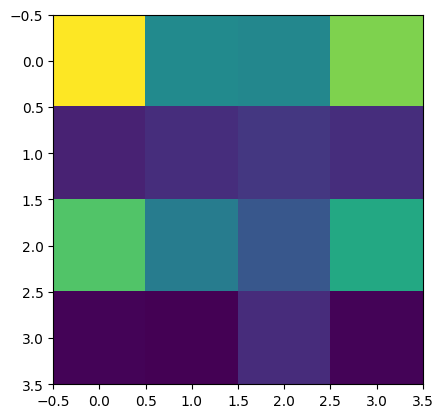

(26, 4, 4)
cluster 10
N samples: 96


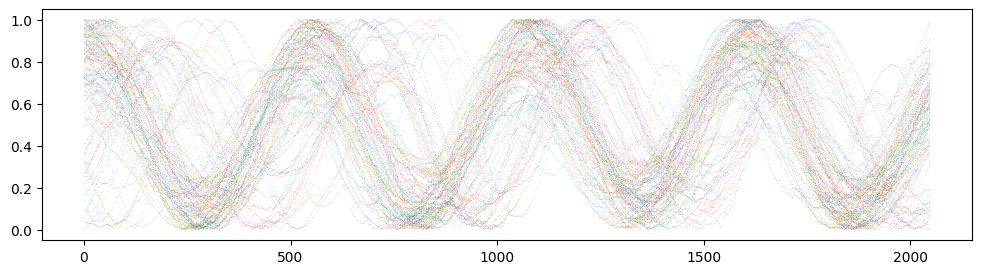

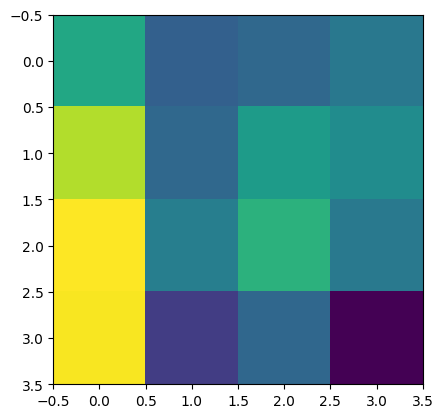

(96, 4, 4)
cluster 11
N samples: 64


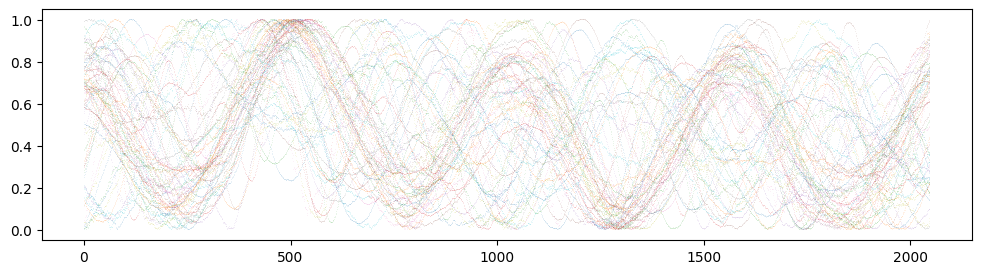

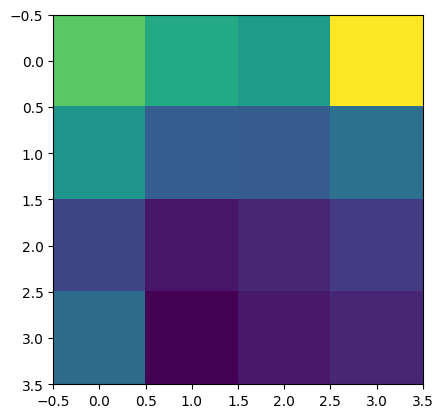

(64, 4, 4)
cluster 12
N samples: 56


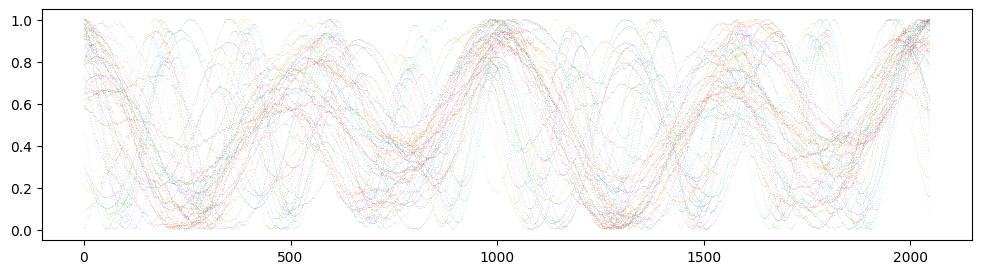

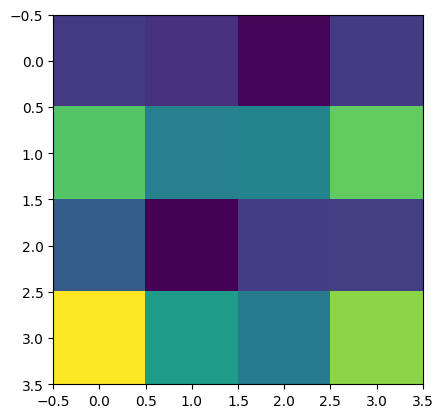

(56, 4, 4)
cluster 13
N samples: 67


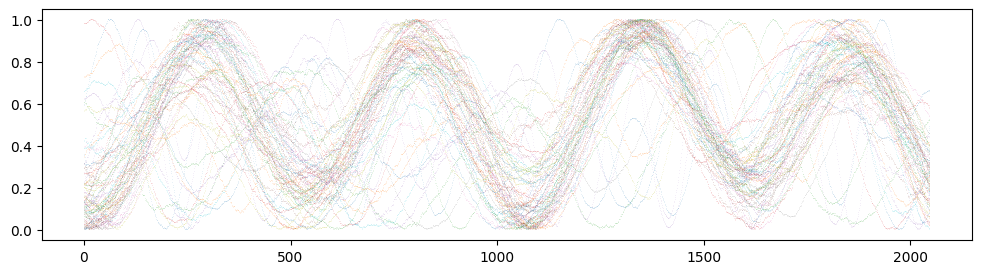

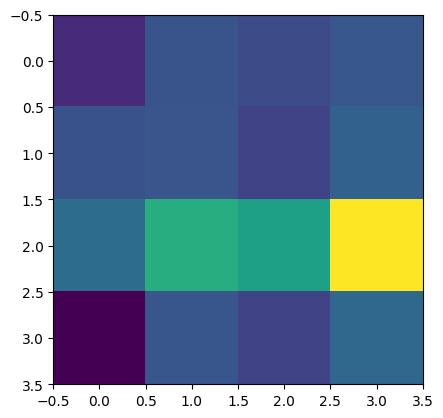

(67, 4, 4)
cluster 14
N samples: 27


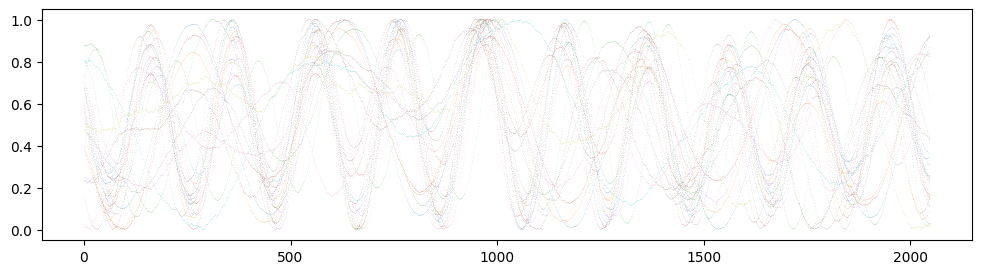

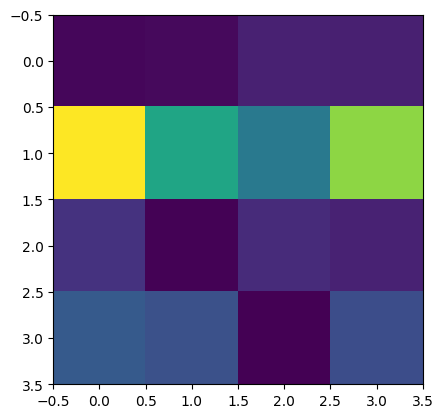

(27, 4, 4)
cluster 15
N samples: 59


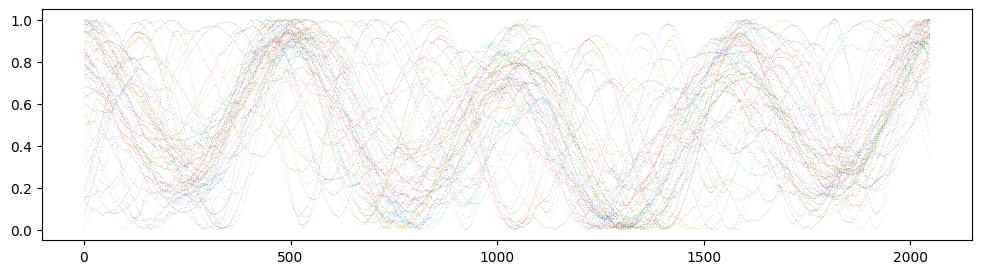

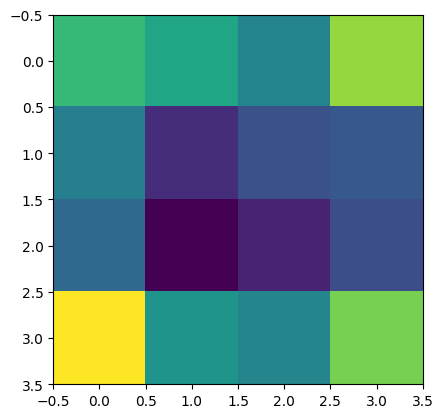

(59, 4, 4)


In [72]:
kmeans = KMeans(n_clusters=viz.elbow_value_)
clustering = kmeans.fit(encoded_2d_pca)
print('-------------')
print("n_clusters:", viz.elbow_value_)
for cluster in np.unique(clustering.labels_):
    cluster_indices = np.where(clustering.labels_ == cluster)[0]
    print("cluster", cluster)
    fig, axes = plot_clusters(cluster_indices)
    plt.show()
    plot_avg_encoding(cluster_indices)
    plt.show()
#     fig, axes = plt.subplots(8, 1)
#     for i, img in enumerate(encoded[cluster_indices][:8]):
#         axes[i].imshow(img)
#     fig.show()

In [ ]:
# from sklearn.cluster import DBSCAN
# dbscan = DBSCAN(eps=4)
# clustering = dbscan.fit(encoded_2d_tsne)
# sc = plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2, c=clustering.labels_, cmap='tab10')
# plt.legend(*sc.legend_elements())
# plt.show()
# for cluster in np.unique(clustering.labels_):
#     cluster_indices = np.where(clustering.labels_ == cluster)[0]
#     print("cluster", cluster)
#     fig, axes = plot_clusters(cluster_indices)
#     plt.show()
#     plot_avg_encoding(cluster_indices)
#     plt.show()